#PERSIAPAN LIBRARY

In [1]:
# @title Install kagglehub & mount Google Drive
!pip install -q kagglehub

from google.colab import drive

drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# @title Import Library

import os
import random

import kagglehub
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from sklearn.metrics import (
    accuracy_score,
    cohen_kappa_score,
    confusion_matrix,
)
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms
from tqdm.auto import tqdm

sns.set_style("whitegrid")


def set_seed(seed: int = 42):
    """Set semua random seed agar hasil reproducible."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)


set_seed(42)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Menggunakan device: {DEVICE}")

Menggunakan device: cuda


#DOWNLOAD DATASET

In [3]:
# @title Kaggle Helper Function
def download_kaggle_dataset(dataset_id, is_competition=False):
    fn = (
        kagglehub.competition_download if is_competition else kagglehub.dataset_download
    )
    path = fn(dataset_id)
    print("Path to dataset:")
    print(path)
    print("Dataset's folders & files:")
    !ls "{path}"
    return path

In [4]:
# @title APTOS 2019 (Original)
# aptos_org_path = download_kaggle_dataset("aptos2019-blindness-detection", is_competition=True)

# # struktur dataset ini: <aptos_org_path>/train.csv + <aptos_org_path>/train_images/<id_code>.png
# # struktur csv ini: "id_code" dan "diagnosis"

In [5]:
# @title APTOS 2019 (224x224)
aptos_224_path = download_kaggle_dataset(
    "sovitrath/diabetic-retinopathy-224x224-2019-data"
)

# struktur dataset ini: <aptos_224_path>/train.csv + <aptos_224_path>/colored_images/<kelas>/<id_code>.png
# struktur csv ini: "id_code" dan "diagnosis"

100%|██████████| 238M/238M [00:02<00:00, 119MB/s]

Extracting files...


Path to dataset:
/root/.cache/kagglehub/datasets/sovitrath/diabetic-retinopathy-224x224-2019-data/versions/4
Dataset's folders & files:
colored_images	train.csv


In [6]:
# @title Dataset Lokal (Google Drive ke disk lokal Colab)
import glob
import shutil

LOCAL_DR_DIR_DRIVE = "/content/drive/MyDrive/BayesianCNN/Dataset/Lokal"
LOCAL_DR_DIR = "/content/data/local_raw"


def copy_drive_to_local(src_dir, dst_dir):
    os.makedirs(dst_dir, exist_ok=True)
    all_files = [
        f
        for f in glob.glob(os.path.join(src_dir, "**", "*"), recursive=True)
        if os.path.isfile(f)
    ]
    copied, skipped = 0, 0
    for src_fp in tqdm(all_files, desc="Copy Drive -> lokal Colab"):
        rel_path = os.path.relpath(src_fp, src_dir)
        dst_fp = os.path.join(dst_dir, rel_path)
        os.makedirs(os.path.dirname(dst_fp), exist_ok=True)
        if os.path.exists(dst_fp) and os.path.getsize(dst_fp) == os.path.getsize(
            src_fp
        ):
            skipped += 1
            continue
        shutil.copy2(src_fp, dst_fp)
        copied += 1
    print(
        f"Selesai copy: {copied} file baru, {skipped} file sudah ada (di-skip, idempotent kalau re-run)."
    )


copy_drive_to_local(LOCAL_DR_DIR_DRIVE, LOCAL_DR_DIR)

print("Isi folder lokal:")
for cls in ["No_DR", "Mild", "Moderate", "Severe", "Proliferate_DR"]:
    n = len(glob.glob(os.path.join(LOCAL_DR_DIR, cls, "*")))
    print(f"  {cls}: {n} file")

Copy Drive -> lokal Colab:   0%|          | 0/351 [00:00<?, ?it/s]

Selesai copy: 351 file baru, 0 file sudah ada (di-skip, idempotent kalau re-run).
Isi folder lokal:
  No_DR: 41 file
  Mild: 29 file
  Moderate: 59 file
  Severe: 67 file
  Proliferate_DR: 155 file


#BUILD DATAFRAME UNTUK SETIAP DATASET

In [7]:
# @title Dataframe Helper Functions
LABEL_NAMES = ["No_DR", "Mild", "Moderate", "Severe", "Proliferate_DR"]
LABEL_MAP = dict(enumerate(LABEL_NAMES))
CLASS_ALIASES = {
    "No_DR": ["No_DR", "0"],
    "Mild": ["Mild", "1"],
    "Moderate": ["Moderate", "2"],
    "Severe": ["Severe", "3"],
    "Proliferate_DR": ["Proliferate_DR", "4"],
}


def resolve_image_path(base_path, extensions=(".jpg", ".jpeg", ".png")):
    if os.path.exists(base_path):
        return base_path
    for ext in extensions:
        if os.path.exists(base_path + ext):
            return base_path + ext
    return None


def load_csv_labeled_df(
    csv_path,
    img_dir,
    id_col,
    label_col,
    source_name,
    filename_suffix="",
    label_map=LABEL_MAP,
    extensions=(".jpg", ".jpeg", ".png"),
):
    meta = pd.read_csv(csv_path)
    rows = []
    for _, row in meta.iterrows():
        base_path = os.path.join(img_dir, f"{row[id_col]}{filename_suffix}")
        img_path = resolve_image_path(base_path, extensions)
        if img_path and row[label_col] in label_map:
            rows.append(
                {
                    "filepath": img_path,
                    "label": label_map[row[label_col]],
                    "source": source_name,
                }
            )
    df = pd.DataFrame(rows)
    df = df[df["filepath"].apply(os.path.exists)].reset_index(drop=True)
    print(f"[{source_name}] valid: {len(df)}")
    print(df["label"].value_counts())
    print("\n")
    return df


def load_class_folder_df(
    root_dir,
    source_name,
    class_aliases=CLASS_ALIASES,
    extensions=(".png", ".jpg", ".jpeg"),
):
    rows = []
    for label, aliases in class_aliases.items():
        folder_path = next(
            (
                os.path.join(root_dir, a)
                for a in aliases
                if os.path.isdir(os.path.join(root_dir, a))
            ),
            None,
        )
        if folder_path is None:
            continue
        rows += [
            {"filepath": fp, "label": label, "source": source_name}
            for fp in glob.glob(os.path.join(folder_path, "*"))
            if fp.lower().endswith(extensions)
        ]
    df = pd.DataFrame(rows)
    df = df[df["filepath"].apply(os.path.exists)].reset_index(drop=True)
    print(f"[{source_name}]")
    print(df["label"].value_counts().sort_index())
    print("\n")
    return df

In [8]:
# @title Load DF Dataset APTOS Original (struktur csv_labeled)
# aptos_org_df = load_csv_labeled_df(
#     csv_path=os.path.join(aptos_org_path, "train.csv"),
#     img_dir=os.path.join(aptos_org_path, "train_images"),
#     id_col="id_code", label_col="diagnosis", source_name="aptos-org",
# )

In [9]:
# @title Load DF Dataset APTOS 224 + Lokal (struktur class_folders)
aptos_224_df = load_class_folder_df(
    root_dir=os.path.join(aptos_224_path, "colored_images"), source_name="aptos-224"
)

local_df = load_class_folder_df(root_dir=LOCAL_DR_DIR, source_name="local")

[aptos-224]
label
Mild               370
Moderate           999
No_DR             1805
Proliferate_DR     295
Severe             193
Name: count, dtype: int64


[local]
label
Mild               29
Moderate           59
No_DR              41
Proliferate_DR    155
Severe             67
Name: count, dtype: int64




#GABUNGKAN DATASET (OPSIONAL)

In [10]:
def build_combined_dataset(dfs: dict[str, pd.DataFrame], seed=42):
    full_df = pd.concat(dfs.values(), ignore_index=True)
    before = len(full_df)
    full_df = full_df[full_df["filepath"].apply(os.path.exists)].reset_index(drop=True)
    print(f"Total baris (combined): {before} | Valid files: {len(full_df)}")
    full_df = full_df.sample(frac=1, random_state=seed).reset_index(drop=True)
    print(full_df["label"].value_counts().sort_index())
    return full_df


full_df = build_combined_dataset(
    {
        # "aptos-org": aptos_org_df,
        "local": local_df,
        "aptos-224": aptos_224_df,
    }
)

Total baris (combined): 4013 | Valid files: 4013
label
Mild               399
Moderate          1058
No_DR             1846
Proliferate_DR     450
Severe             260
Name: count, dtype: int64


#IMAGE PREPROCESSOR

In [11]:
# @title Preprocessing BEN (Brightness Enhancement Normalization)

import cv2

cv2.setNumThreads(0)


def preprocess_image(img_rgb, img_size=224, crop_thresh=7, sigma=40):
    """
    Implementasi Preprocessing BEN (Brightness Enhancement Normalization)

    Langkah:
    1. Gray Area Cropping (threshold = 7)
    2. Padding untuk menjaga rasio aspek 1:1
    3. Resizing ke (img_size, img_size)
    4. Gaussian Blur Smoothing (sigma = 40)
    5. BEN (Brightness & Contrast Normalization: 4 * img - 4 * blurred + 128)
    """
    original = img_rgb.copy()
    try:
        # ----------------------------------------------------
        # LANGKAH 1: Gray Area Cropping (Removing Dark Regions)
        # ----------------------------------------------------
        gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
        mask = gray > crop_thresh

        # Jika gambar tidak terlalu gelap / masker valid
        if np.any(mask):
            coords = np.argwhere(mask)
            y0, x0 = coords.min(axis=0)
            y1, x1 = coords.max(axis=0)

            # Batas potongan retina
            if (y1 - y0) >= 10 and (x1 - x0) >= 10:
                cropped = img_rgb[y0:y1, x0:x1]
            else:
                cropped = img_rgb
        else:
            cropped = img_rgb  # Fallback jika gambar terlalu gelap

        # ----------------------------------------------------
        # LANGKAH 2: Padding for Uniform Size (Preserve Aspect Ratio)
        # ----------------------------------------------------
        h, w, c = cropped.shape
        max_dim = max(h, w)

        # Hitung padding atas, bawah, kiri, kanan agar menjadi persegi (1:1)
        pad_y = max_dim - h
        pad_x = max_dim - w

        top, bottom = pad_y // 2, pad_y - (pad_y // 2)
        left, right = pad_x // 2, pad_x - (pad_x // 2)

        # Tambahkan padding hitam (0, 0, 0) di sekeliling cropped retina
        padded = cv2.copyMakeBorder(
            cropped,
            top,
            bottom,
            left,
            right,
            borderType=cv2.BORDER_CONSTANT,
            value=[0, 0, 0],
        )

        # ----------------------------------------------------
        # LANGKAH 3: Image Resizing ke Uniform Size (224 x 224)
        # ----------------------------------------------------
        resized = cv2.resize(padded, (img_size, img_size), interpolation=cv2.INTER_AREA)

        # ----------------------------------------------------
        # LANGKAH 4 & 5: Brightness and Contrast Adjustment (BEN)
        # ----------------------------------------------------
        # Gaussian blur dengan sigma=40
        blurred = cv2.GaussianBlur(resized, (0, 0), sigma)

        # Formula BEN: 4 * resized - 4 * blurred + 128
        ben_img = cv2.addWeighted(resized, 4, blurred, -4, 128)

        return ben_img

    except Exception:
        # Fallback jika terjadi kesalahan pembacaan
        return cv2.resize(original, (img_size, img_size), interpolation=cv2.INTER_AREA)

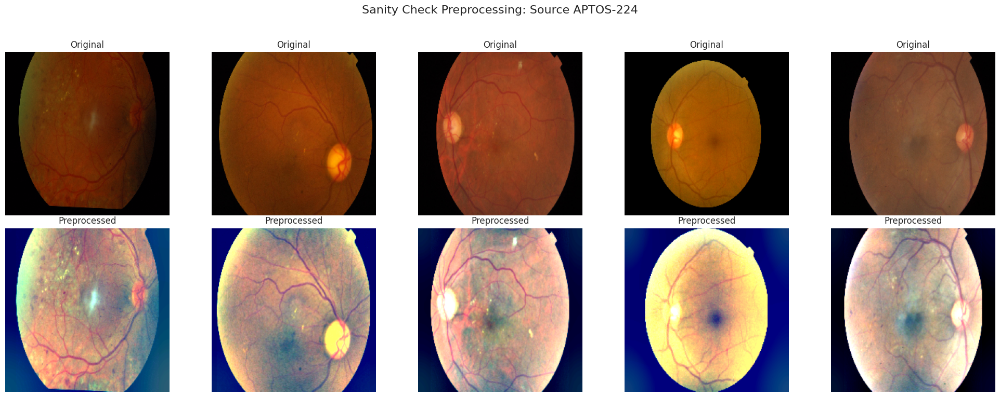

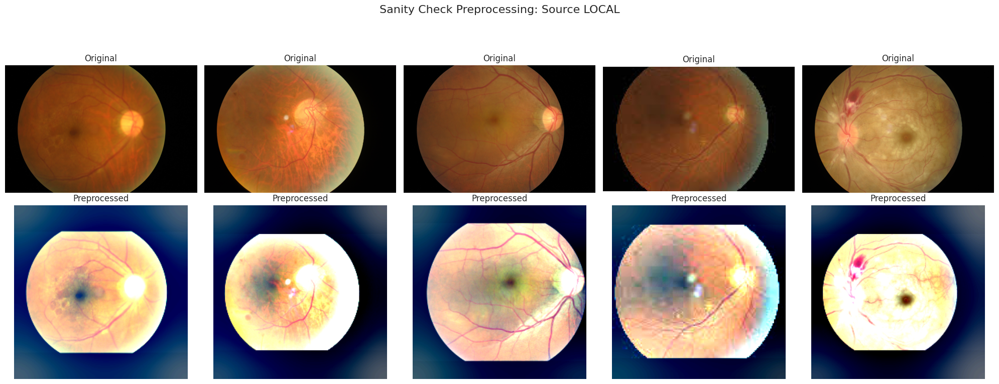

In [12]:
# @title Sanity check preprocessing on sample images

import glob


def _load_rgb(path):
    img = cv2.imread(path)
    if img is None:
        raise ValueError(f"Gagal membaca gambar: {path}")
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


def visualize_samples(df, source_name, num_samples=5):
    sample_paths = (
        df[df["source"] == source_name]["filepath"].head(num_samples).tolist()
    )
    if not sample_paths:
        print(f"Tidak ada sampel untuk sumber: {source_name}")
        return

    fig, axes = plt.subplots(2, len(sample_paths), figsize=(4 * len(sample_paths), 8))
    fig.suptitle(
        f"Sanity Check Preprocessing: Source {source_name.upper()}", fontsize=16
    )

    for i, p in enumerate(sample_paths):
        raw = _load_rgb(p)
        proc = preprocess_image(raw)

        # Tampilkan Raw
        axes[0, i].imshow(raw)
        axes[0, i].set_title("Original")
        axes[0, i].axis("off")

        # Tampilkan Preprocessed
        axes[1, i].imshow(proc)
        axes[1, i].set_title("Preprocessed")
        axes[1, i].axis("off")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


# Visualisasi untuk tiap sumber
for src in full_df["source"].unique():
    visualize_samples(full_df, src)

#STRATIFIED SPLIT & TRAIN BALANCING FUNCTION

In [13]:
def get_split(df, scenario="80:20", seed=42):
    """
    scenario ∈ {"70:30", "80:20", "90:10"} — rasio (train+val) : test
    Di dalam porsi (train+val), rasio train:val selalu 80:20, mengikuti tabel proposal:
      70:30 -> train 56% | val 14% | test 30%
      80:20 -> train 64% | val 16% | test 20%
      90:10 -> train 72% | val 18% | test 10%
    """
    trainval_frac = {"70:30": 0.70, "80:20": 0.80, "90:10": 0.90}[scenario]
    trainval_df, test_df = train_test_split(
        df, test_size=1 - trainval_frac, random_state=seed, stratify=df["label"]
    )
    train_df, val_df = train_test_split(
        trainval_df, test_size=0.20, random_state=seed, stratify=trainval_df["label"]
    )
    return (
        train_df.reset_index(drop=True),
        val_df.reset_index(drop=True),
        test_df.reset_index(drop=True),
    )


def oversample_train(df, seed=42):
    """Oversampling data latih ke jumlah kelas mayoritas (tanpa undersampling)."""
    counts = df["label"].value_counts()
    max_n = counts.max()
    parts = []
    for label, n in counts.items():
        df_cls = df[df["label"] == label]
        parts.append(
            df_cls
            if n == max_n
            else df_cls.sample(max_n, replace=True, random_state=seed)
        )
    return pd.concat(parts).sample(frac=1, random_state=seed).reset_index(drop=True)

#PERSIAPAN DATASET PELATIHAN

In [14]:
# @title Precompute preprocessing cache function
import hashlib

CACHE_DIR = "/content/preprocess_cache"
os.makedirs(CACHE_DIR, exist_ok=True)


def _cache_path(filepath, img_size=224):
    h = hashlib.md5(f"{filepath}_{img_size}".encode()).hexdigest()
    return os.path.join(CACHE_DIR, f"{h}.png")


def precompute_cache(df, img_size=224):
    """Jalankan preprocess_image SEKALI utk tiap gambar unik, simpan hasilnya sbg
    PNG 224x224 di CACHE_DIR. Idempotent: kalau file cache sudah ada, dilewati
    (aman dipanggil ulang / lanjut kalau sesi Colab keputus di tengah jalan)."""
    n_done, n_skip, n_fail = 0, 0, 0
    for fp in tqdm(df["filepath"].unique(), desc="Precompute cache"):
        cpath = _cache_path(fp, img_size)
        if os.path.exists(cpath):
            n_skip += 1
            continue
        img_bgr = cv2.imread(fp)
        if img_bgr is None:
            print(f"WARNING: gagal load {fp}, dilewati")
            n_fail += 1
            continue
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        img_proc = preprocess_image(img_rgb, img_size=img_size)
        cv2.imwrite(cpath, cv2.cvtColor(img_proc, cv2.COLOR_RGB2BGR))
        n_done += 1
    print(
        f"Selesai: {n_done} gambar baru di-cache, {n_skip} sudah ada (skip), {n_fail} gagal."
    )

In [15]:
# @title Custom PyTorch Dataset (dgn cache preprocessing)


class DRDataset(Dataset):
    LABEL_TO_IDX = {
        "No_DR": 0,
        "Mild": 1,
        "Moderate": 2,
        "Severe": 3,
        "Proliferate_DR": 4,
    }

    def __init__(self, df, img_size=224, transform=None, use_cache=True):
        self.df = df.reset_index(drop=True)
        self.img_size = img_size
        self.transform = transform
        self.use_cache = use_cache

    def __len__(self):
        return len(self.df)

    def _load_processed(self, filepath):
        if self.use_cache:
            cpath = _cache_path(filepath, self.img_size)
            if os.path.exists(cpath):
                img_bgr = cv2.imread(cpath)
                return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        # cache miss
        img_bgr = cv2.imread(filepath)
        if img_bgr is None:
            raise ValueError(f"Gagal membaca gambar: {filepath}")
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        return preprocess_image(img_rgb, img_size=self.img_size)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_proc = self._load_processed(row["filepath"])
        img_pil = Image.fromarray(img_proc)

        if self.transform is not None:
            img_tensor = self.transform(img_pil)
        else:
            img_tensor = transforms.ToTensor()(img_pil)

        label_idx = self.LABEL_TO_IDX[row["label"]]
        return img_tensor, label_idx

In [16]:
# @title Transforms (augmentasi + normalisasi)
IMG_SIZE = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

# augmentasi hanya untuk train; val/test hanya normalisasi
train_transform = transforms.Compose(
    [
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomRotation(degrees=20),
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ]
)

val_transform = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ]
)

#Bayesian CNN (DenseNet-121 backbone + MC Dropout)

In [17]:
# @title BCNN model builder
NUM_CLASSES = 5
DROPOUT_P = 0.4


class DenseNet121Head(nn.Module):
    """
    Feature map akhir -> Spatial MC Dropout -> GAP -> BatchNorm ->
    Dense(hidden_dim) ReLU -> MC Dropout -> Dense(num_classes)
    Set use_mc_dropout=False digunakan untuk varian "DenseNet121 biasa" (baseline deterministik).
    """

    def __init__(
        self,
        num_classes=5,
        hidden_dim=256,
        dropout_rate=0.4,
        use_mc_dropout=True,
        pretrained=True,
    ):
        super().__init__()
        weights = models.DenseNet121_Weights.DEFAULT if pretrained else None
        backbone = models.densenet121(weights=weights)
        self.features = backbone.features  # include_top=False
        in_features = backbone.classifier.in_features  # 1024

        self.spatial_dropout = (
            nn.Dropout2d(p=dropout_rate) if use_mc_dropout else nn.Identity()
        )
        self.gap = nn.AdaptiveAvgPool2d((1, 1))
        self.bn = nn.BatchNorm1d(in_features)
        self.fc1 = nn.Linear(in_features, hidden_dim)
        self.relu = nn.ReLU(inplace=True)
        self.mc_dropout = (
            nn.Dropout(p=dropout_rate) if use_mc_dropout else nn.Identity()
        )
        self.fc2 = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        x = self.features(x)
        x = F.relu(x, inplace=True)  # feature map akhir
        x = self.spatial_dropout(x)  # Spatial MC Dropout
        x = self.gap(x)  # GAP
        x = torch.flatten(x, 1)
        x = self.bn(x)  # Batch Normalization
        x = self.fc1(x)
        x = self.relu(x)  # Dense 256/512 + ReLU
        x = self.mc_dropout(x)  # MC Dropout
        return self.fc2(x)  # Dense 5 (softmax via CrossEntropyLoss/F.softmax)


def build_model(
    model_type, num_classes=5, hidden_dim=256, dropout_rate=0.4, pretrained=True
):
    """model_type ∈ {"deterministic", "bayesian"}"""
    return DenseNet121Head(
        num_classes,
        hidden_dim,
        dropout_rate,
        use_mc_dropout=(model_type == "bayesian"),
        pretrained=pretrained,
    )

In [18]:
# @title MC Dropout Inference Functions


def enable_mc_dropout(model):
    for m in model.modules():
        if isinstance(m, (nn.Dropout, nn.Dropout2d)):
            m.train()


def mc_dropout_predict(model, x, T=25):
    """
    Melakukan T kali forward pass Monte Carlo Dropout
    dan menghitung Predictive Entropy, Aleatoric Entropy, serta Epistemic Uncertainty (MI/BALD).
    """
    model.eval()  # Set model ke mode eval (BatchNorm menggunakan running stats)
    enable_mc_dropout(model)  # Aktifkan khusus layer Dropout

    probs_samples = []
    with torch.no_grad():
        for _ in range(T):
            logits = model(x)
            probs = F.softmax(logits, dim=1)
            probs_samples.append(probs.unsqueeze(0))

    # Tensor shape: (T, Batch_size, Num_classes)
    probs_samples = torch.cat(probs_samples, dim=0)

    # Mean probability over T samples (Prediksi akhir)
    mean_probs = probs_samples.mean(dim=0)

    eps = 1e-12
    # Total Predictive Entropy
    predictive_entropy = -(mean_probs * torch.log(mean_probs + eps)).sum(dim=1)

    # Aleatoric Uncertainty (Rata-rata entropy per-sample)
    per_sample_entropy = -(probs_samples * torch.log(probs_samples + eps)).sum(dim=2)
    aleatoric_entropy = per_sample_entropy.mean(dim=0)

    # Epistemic Uncertainty (Mutual Information / BALD)
    epistemic_uncertainty = predictive_entropy - aleatoric_entropy
    # Koreksi presisi numerik jika ada nilai negatif sangat kecil
    epistemic_uncertainty = torch.clamp(epistemic_uncertainty, min=0.0)

    return {
        "mean_probs": mean_probs,
        "predictive_entropy": predictive_entropy,
        "aleatoric_entropy": aleatoric_entropy,
        "epistemic_uncertainty": epistemic_uncertainty,
    }

#Fungsi-fungsi Pelatihan Model

In [19]:
# @title Helper Functions untuk Training & Validasi
import os

import torch
import torch.nn as nn
from tqdm.notebook import tqdm

criterion = nn.CrossEntropyLoss()


def train_one_epoch(model, loader, optimizer, criterion, scaler, device):
    model.train()
    running_loss = 0.0
    all_preds, all_labels = [], []

    pbar = tqdm(loader, desc="Train", leave=False)
    for imgs, labels in pbar:
        imgs, labels = (
            imgs.to(device, non_blocking=True),
            labels.to(device, non_blocking=True),
        )
        optimizer.zero_grad(set_to_none=True)

        # Mixed Precision Forward Pass
        with torch.amp.autocast("cuda", enabled=(device.type == "cuda")):
            logits = model(imgs)
            loss = criterion(logits, labels)

        # Backward Pass menggunakan GradScaler
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * imgs.size(0)
        preds = logits.argmax(dim=1)

        all_preds.extend(preds.detach().cpu().numpy())
        all_labels.extend(labels.detach().cpu().numpy())
        pbar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_loss = running_loss / len(loader.dataset)
    epoch_acc = accuracy_score(all_labels, all_preds)
    epoch_qwk = cohen_kappa_score(all_labels, all_preds, weights="quadratic")
    return epoch_loss, epoch_acc, epoch_qwk


@torch.no_grad()
def evaluate(model, loader, criterion, device):
    """Evaluasi deterministik untuk pemantauan validasi tiap epoch."""
    model.eval()
    running_loss = 0.0
    all_preds, all_labels = [], []

    pbar = tqdm(loader, desc="Val", leave=False)
    for imgs, labels in pbar:
        imgs, labels = (
            imgs.to(device, non_blocking=True),
            labels.to(device, non_blocking=True),
        )

        with torch.amp.autocast("cuda", enabled=(device.type == "cuda")):
            logits = model(imgs)
            loss = criterion(logits, labels)

        running_loss += loss.item() * imgs.size(0)
        preds = logits.argmax(dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        pbar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_loss = running_loss / len(loader.dataset)
    epoch_acc = accuracy_score(all_labels, all_preds)
    epoch_qwk = cohen_kappa_score(all_labels, all_preds, weights="quadratic")
    return epoch_loss, epoch_acc, epoch_qwk

In [20]:
# @title Helper Function untuk metrik Sensifity & Specificity
from sklearn.metrics import precision_score


def compute_sens_spec(cm):
    """Sensitivity & Specificity per kelas dari confusion matrix (one-vs-rest)."""
    n = cm.shape[0]
    total = cm.sum()
    sens, spec = np.zeros(n), np.zeros(n)
    for i in range(n):
        TP = cm[i, i]
        FN = cm[i, :].sum() - TP
        FP = cm[:, i].sum() - TP
        TN = total - TP - FN - FP
        sens[i] = TP / (TP + FN) if (TP + FN) else 0.0
        spec[i] = TN / (TN + FP) if (TN + FP) else 0.0
    return sens, spec

In [21]:
# @title Fungsi Pelatihan Utama (Warm-up & Full Fine-Tuning) + Evaluasi Performa
import json

DRIVE_EXP_ROOT = "/content/drive/MyDrive/BayesianCNN/Experiments"


def run_experiment(
    df,
    model_type,
    split_scenario,
    experiment_name,
    epochs_p1=5,
    epochs_p2=45,
    patience=12,
    img_size=224,
    hidden_dim=256,
):
    print(
        f"\n{'=' * 70}\nEKSPERIMEN: {experiment_name} ({model_type}, split {split_scenario})\n{'=' * 70}"
    )

    # 0. Folder di Drive (untuk output final) + path checkpoint LOKAL (untuk selama training)
    exp_dir = os.path.join(DRIVE_EXP_ROOT, experiment_name)
    os.makedirs(exp_dir, exist_ok=True)
    ckpt_path_local = f"/content/{experiment_name}_best.pt"

    # 1. Split & balancing
    train_df, val_df, test_df = get_split(df, split_scenario)
    train_df = oversample_train(train_df)
    print(
        f"Train (oversampled): {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}"
    )

    # 2. Cache & dataset/loader
    precompute_cache(train_df, img_size)
    precompute_cache(val_df, img_size)
    precompute_cache(test_df, img_size)
    train_loader = DataLoader(
        DRDataset(train_df, img_size, train_transform),
        batch_size=64,
        shuffle=True,
        num_workers=0,
    )
    val_loader = DataLoader(
        DRDataset(val_df, img_size, val_transform),
        batch_size=64,
        shuffle=False,
        num_workers=0,
    )
    test_loader = DataLoader(
        DRDataset(test_df, img_size, val_transform),
        batch_size=64,
        shuffle=False,
        num_workers=0,
    )

    # 3. Model
    model = build_model(model_type, hidden_dim=hidden_dim).to(DEVICE)
    criterion = nn.CrossEntropyLoss()
    scaler = torch.amp.GradScaler("cuda", enabled=(DEVICE.type == "cuda"))
    history = {
        "train_loss": [],
        "train_acc": [],
        "train_qwk": [],
        "val_loss": [],
        "val_acc": [],
        "val_qwk": [],
    }
    best_val_qwk = -1.0

    # 4. Fase 1: warm-up head (backbone frozen)
    for p in model.features.parameters():
        p.requires_grad = False
    optimizer = torch.optim.Adam(
        filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3
    )
    for epoch in range(1, epochs_p1 + 1):
        tr_loss, tr_acc, tr_qwk = train_one_epoch(
            model, train_loader, optimizer, criterion, scaler, DEVICE
        )
        v_loss, v_acc, v_qwk = evaluate(model, val_loader, criterion, DEVICE)
        history["train_loss"].append(tr_loss)
        history["train_acc"].append(tr_acc)
        history["train_qwk"].append(tr_qwk)
        history["val_loss"].append(v_loss)
        history["val_acc"].append(v_acc)
        history["val_qwk"].append(v_qwk)
        print(
            f"[P1 {epoch:02d}/{epochs_p1}] train_loss={tr_loss:.4f} val_loss={v_loss:.4f} | train_acc={tr_acc:.4f} val_acc={v_acc:.4f} | train_qwk={tr_qwk:.4f} val_qwk={v_qwk:.4f}"
        )
        if v_qwk > best_val_qwk:
            best_val_qwk = v_qwk
            torch.save(
                {
                    "model_state_dict": model.state_dict(),
                    "epoch": epoch,
                    "phase": 1,
                    "val_qwk": v_qwk,
                },
                ckpt_path_local,
            )

    # 5. Fase 2: full fine-tuning
    for p in model.parameters():
        p.requires_grad = True
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="max", factor=0.5, patience=3, min_lr=1e-7
    )
    no_improve = 0
    for epoch in range(1, epochs_p2 + 1):
        tr_loss, tr_acc, tr_qwk = train_one_epoch(
            model, train_loader, optimizer, criterion, scaler, DEVICE
        )
        v_loss, v_acc, v_qwk = evaluate(model, val_loader, criterion, DEVICE)
        scheduler.step(v_qwk)
        history["train_loss"].append(tr_loss)
        history["train_acc"].append(tr_acc)
        history["train_qwk"].append(tr_qwk)
        history["val_loss"].append(v_loss)
        history["val_acc"].append(v_acc)
        history["val_qwk"].append(v_qwk)
        print(
            f"[P2 {epoch:02d}/{epochs_p2}] train_loss={tr_loss:.4f} val_loss={v_loss:.4f} | train_acc={tr_acc:.4f} val_acc={v_acc:.4f} | train_qwk={tr_qwk:.4f} val_qwk={v_qwk:.4f} | lr={optimizer.param_groups[0]['lr']:.2e}"
        )
        if v_qwk > best_val_qwk:
            best_val_qwk = v_qwk
            no_improve = 0
            torch.save(
                {
                    "model_state_dict": model.state_dict(),
                    "epoch": epoch,
                    "phase": 2,
                    "val_qwk": v_qwk,
                },
                ckpt_path_local,
            )
        else:
            no_improve += 1
            if no_improve >= patience:
                print(f"[EARLY STOPPING] epoch {epoch}")
                break

    # 6. Muat checkpoint terbaik (dari lokal), evaluasi, kemudian dicopy ke Drive sekali
    ckpt = torch.load(ckpt_path_local, map_location=DEVICE, weights_only=False)
    model.load_state_dict(ckpt["model_state_dict"])
    print(
        f"Checkpoint terbaik: epoch {ckpt['epoch']} (fase {ckpt['phase']}, val_qwk={ckpt['val_qwk']:.4f})"
    )

    ckpt_path_drive = os.path.join(exp_dir, "best_model.pt")
    shutil.copy2(ckpt_path_local, ckpt_path_drive)  # copy ke Drive
    print(f"Model terbaik disalin ke: {ckpt_path_drive}")

    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for imgs, labels in test_loader:
            logits = model(imgs.to(DEVICE))
            all_preds.extend(logits.argmax(1).cpu().numpy())
            all_labels.extend(labels.numpy())
    all_preds, all_labels = np.array(all_preds), np.array(all_labels)

    acc = accuracy_score(all_labels, all_preds)
    qwk = cohen_kappa_score(all_labels, all_preds, weights="quadratic")
    prec = precision_score(all_labels, all_preds, average="macro", zero_division=0)
    cm = confusion_matrix(all_labels, all_preds)
    sens, spec = compute_sens_spec(cm)
    class_names = list(DRDataset.LABEL_TO_IDX.keys())

    # 7. Plot
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    axes[0].plot(history["train_acc"], label="train")
    axes[0].plot(history["val_acc"], label="val")
    axes[0].set_title(f"{experiment_name} - Accuracy per Epoch")
    axes[0].set_xlabel("epoch")
    axes[0].legend()
    axes[1].plot(history["train_loss"], label="train")
    axes[1].plot(history["val_loss"], label="val")
    axes[1].set_title(f"{experiment_name} - Loss per Epoch")
    axes[1].set_xlabel("epoch")
    axes[1].legend()
    plt.tight_layout()
    plt.savefig(
        os.path.join(exp_dir, "accuracy_loss_curve.png"), dpi=150, bbox_inches="tight"
    )
    plt.show()

    fig, ax = plt.subplots(figsize=(6, 5))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names,
        ax=ax,
    )
    ax.set_title(f"{experiment_name} - Confusion Matrix")
    ax.set_xlabel("Predicted")
    ax.set_ylabel("True")
    plt.tight_layout()
    plt.savefig(
        os.path.join(exp_dir, "confusion_matrix.png"), dpi=150, bbox_inches="tight"
    )
    plt.show()

    # 8. history training, confusion matrix, ringkasan metrik
    pd.DataFrame(history).to_csv(os.path.join(exp_dir, "history.csv"), index=False)
    pd.DataFrame(cm, index=class_names, columns=class_names).to_csv(
        os.path.join(exp_dir, "confusion_matrix.csv")
    )

    metrics = {
        "experiment": experiment_name,
        "model_type": model_type,
        "split_scenario": split_scenario,
        "accuracy": acc,
        "precision_macro": prec,
        "sensitivity_macro": sens.mean(),
        "specificity_macro": spec.mean(),
        "qwk": qwk,
        "best_epoch": ckpt["epoch"],
        "best_phase": ckpt["phase"],
    }
    with open(os.path.join(exp_dir, "metrics.json"), "w") as f:
        json.dump(metrics, f, indent=2)

    print(
        f"\n{experiment_name}: Acc={acc:.4f} | Precision(macro)={prec:.4f} | "
        f"Sensitivity(macro)={sens.mean():.4f} | Specificity(macro)={spec.mean():.4f} | QWK={qwk:.4f}"
    )
    print(f"Semua output tersimpan di: {exp_dir}")

    return {
        **metrics,
        "model": model,
        "history": history,
        "confusion_matrix": cm,
        "test_loader": test_loader,
    }

#EKSPERIMEN UTAMA

In [22]:
results = []


EKSPERIMEN: APTOS-224_deterministic_70:30 (deterministic, split 70:30)
Train (oversampled): 5050 | Val: 513 | Test: 1099


Precompute cache:   0%|          | 0/1948 [00:00<?, ?it/s]

Selesai: 1948 gambar baru di-cache, 0 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/513 [00:00<?, ?it/s]

Selesai: 513 gambar baru di-cache, 0 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/1099 [00:00<?, ?it/s]

Selesai: 1099 gambar baru di-cache, 0 sudah ada (skip), 0 gagal.
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 162MB/s] 


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P1 01/5] train_loss=0.8689 val_loss=0.7429 | train_acc=0.6497 val_acc=0.7251 | train_qwk=0.7420 val_qwk=0.8121


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P1 02/5] train_loss=0.5882 val_loss=0.7280 | train_acc=0.7673 val_acc=0.7076 | train_qwk=0.8471 val_qwk=0.8148


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P1 03/5] train_loss=0.4640 val_loss=0.6334 | train_acc=0.8285 val_acc=0.7758 | train_qwk=0.8887 val_qwk=0.8458


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P1 04/5] train_loss=0.3892 val_loss=0.6497 | train_acc=0.8566 val_acc=0.7719 | train_qwk=0.9085 val_qwk=0.8535


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P1 05/5] train_loss=0.3468 val_loss=0.6400 | train_acc=0.8725 val_acc=0.7973 | train_qwk=0.9166 val_qwk=0.8617


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 01/45] train_loss=0.2817 val_loss=0.6486 | train_acc=0.8976 val_acc=0.7934 | train_qwk=0.9375 val_qwk=0.8550 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 02/45] train_loss=0.1623 val_loss=0.6965 | train_acc=0.9469 val_acc=0.7836 | train_qwk=0.9701 val_qwk=0.8530 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 03/45] train_loss=0.1075 val_loss=0.7091 | train_acc=0.9681 val_acc=0.7875 | train_qwk=0.9816 val_qwk=0.8558 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 04/45] train_loss=0.0836 val_loss=0.7147 | train_acc=0.9766 val_acc=0.7875 | train_qwk=0.9870 val_qwk=0.8601 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 05/45] train_loss=0.0652 val_loss=0.7384 | train_acc=0.9818 val_acc=0.7953 | train_qwk=0.9877 val_qwk=0.8715 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 06/45] train_loss=0.0519 val_loss=0.7630 | train_acc=0.9867 val_acc=0.8031 | train_qwk=0.9904 val_qwk=0.8743 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 07/45] train_loss=0.0456 val_loss=0.8592 | train_acc=0.9879 val_acc=0.8090 | train_qwk=0.9933 val_qwk=0.8901 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 08/45] train_loss=0.0446 val_loss=0.8650 | train_acc=0.9875 val_acc=0.7934 | train_qwk=0.9929 val_qwk=0.8604 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 09/45] train_loss=0.0330 val_loss=0.8760 | train_acc=0.9907 val_acc=0.7973 | train_qwk=0.9936 val_qwk=0.8582 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 10/45] train_loss=0.0329 val_loss=0.8379 | train_acc=0.9907 val_acc=0.8207 | train_qwk=0.9935 val_qwk=0.8693 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 11/45] train_loss=0.0302 val_loss=0.8936 | train_acc=0.9911 val_acc=0.8012 | train_qwk=0.9938 val_qwk=0.8712 | lr=5.00e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 12/45] train_loss=0.0226 val_loss=0.9092 | train_acc=0.9935 val_acc=0.7895 | train_qwk=0.9956 val_qwk=0.8695 | lr=5.00e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 13/45] train_loss=0.0196 val_loss=0.9086 | train_acc=0.9925 val_acc=0.7895 | train_qwk=0.9944 val_qwk=0.8670 | lr=5.00e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 14/45] train_loss=0.0194 val_loss=0.9242 | train_acc=0.9927 val_acc=0.7992 | train_qwk=0.9946 val_qwk=0.8702 | lr=5.00e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 15/45] train_loss=0.0173 val_loss=0.9311 | train_acc=0.9937 val_acc=0.8012 | train_qwk=0.9956 val_qwk=0.8829 | lr=2.50e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 16/45] train_loss=0.0169 val_loss=0.9404 | train_acc=0.9941 val_acc=0.8031 | train_qwk=0.9965 val_qwk=0.8801 | lr=2.50e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 17/45] train_loss=0.0156 val_loss=0.9259 | train_acc=0.9943 val_acc=0.7953 | train_qwk=0.9970 val_qwk=0.8747 | lr=2.50e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 18/45] train_loss=0.0153 val_loss=0.9134 | train_acc=0.9933 val_acc=0.7973 | train_qwk=0.9956 val_qwk=0.8757 | lr=2.50e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 19/45] train_loss=0.0143 val_loss=0.9174 | train_acc=0.9935 val_acc=0.7914 | train_qwk=0.9952 val_qwk=0.8765 | lr=1.25e-05
[EARLY STOPPING] epoch 19
Checkpoint terbaik: epoch 7 (fase 2, val_qwk=0.8901)
Model terbaik disalin ke: /content/drive/MyDrive/BayesianCNN/Experiments/APTOS-224_deterministic_70:30/best_model.pt


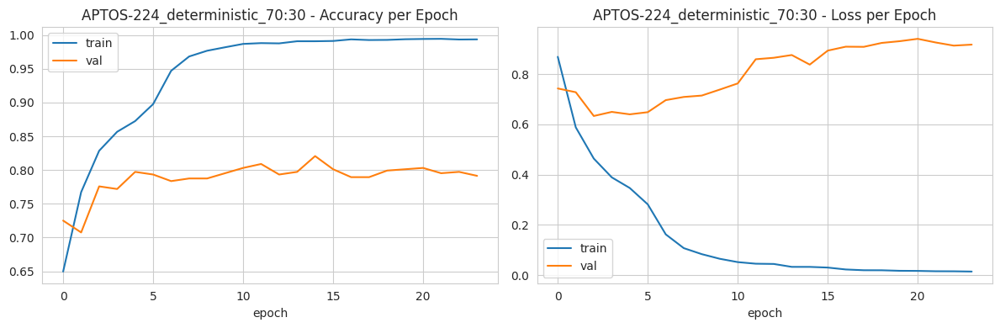

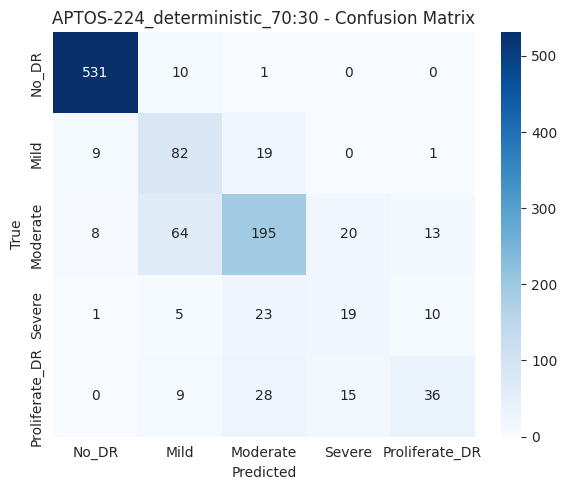


APTOS-224_deterministic_70:30: Acc=0.7853 | Precision(macro)=0.6269 | Sensitivity(macro)=0.6210 | Specificity(macro)=0.9465 | QWK=0.8577
Semua output tersimpan di: /content/drive/MyDrive/BayesianCNN/Experiments/APTOS-224_deterministic_70:30

EKSPERIMEN: APTOS-224_bayesian_70:30 (bayesian, split 70:30)
Train (oversampled): 5050 | Val: 513 | Test: 1099


Precompute cache:   0%|          | 0/1948 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 1948 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/513 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 513 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/1099 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 1099 sudah ada (skip), 0 gagal.


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P1 01/5] train_loss=1.1718 val_loss=0.7165 | train_acc=0.5105 val_acc=0.7271 | train_qwk=0.6206 val_qwk=0.8130


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P1 02/5] train_loss=0.9674 val_loss=0.6835 | train_acc=0.5949 val_acc=0.7329 | train_qwk=0.7133 val_qwk=0.8134


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P1 03/5] train_loss=0.9592 val_loss=0.6469 | train_acc=0.5970 val_acc=0.7446 | train_qwk=0.7205 val_qwk=0.8134


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P1 04/5] train_loss=0.9243 val_loss=0.6210 | train_acc=0.6135 val_acc=0.7485 | train_qwk=0.7224 val_qwk=0.8198


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P1 05/5] train_loss=0.9031 val_loss=0.6121 | train_acc=0.6242 val_acc=0.7563 | train_qwk=0.7373 val_qwk=0.8377


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 01/45] train_loss=0.7355 val_loss=0.6301 | train_acc=0.7050 val_acc=0.7563 | train_qwk=0.8132 val_qwk=0.8624 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 02/45] train_loss=0.4987 val_loss=0.5899 | train_acc=0.8129 val_acc=0.7563 | train_qwk=0.8868 val_qwk=0.8443 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 03/45] train_loss=0.3308 val_loss=0.5908 | train_acc=0.8881 val_acc=0.7875 | train_qwk=0.9342 val_qwk=0.8749 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 04/45] train_loss=0.2269 val_loss=0.7773 | train_acc=0.9190 val_acc=0.7739 | train_qwk=0.9559 val_qwk=0.8823 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 05/45] train_loss=0.1694 val_loss=0.7130 | train_acc=0.9444 val_acc=0.7856 | train_qwk=0.9702 val_qwk=0.8542 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 06/45] train_loss=0.1409 val_loss=0.7460 | train_acc=0.9523 val_acc=0.7836 | train_qwk=0.9738 val_qwk=0.8664 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 07/45] train_loss=0.0994 val_loss=0.7748 | train_acc=0.9687 val_acc=0.7836 | train_qwk=0.9799 val_qwk=0.8595 | lr=1.00e-04


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 08/45] train_loss=0.0898 val_loss=0.8281 | train_acc=0.9675 val_acc=0.7797 | train_qwk=0.9816 val_qwk=0.8605 | lr=5.00e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 09/45] train_loss=0.0688 val_loss=0.8718 | train_acc=0.9790 val_acc=0.7875 | train_qwk=0.9880 val_qwk=0.8734 | lr=5.00e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 10/45] train_loss=0.0481 val_loss=0.9220 | train_acc=0.9848 val_acc=0.7700 | train_qwk=0.9909 val_qwk=0.8630 | lr=5.00e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 11/45] train_loss=0.0487 val_loss=0.9197 | train_acc=0.9879 val_acc=0.7934 | train_qwk=0.9910 val_qwk=0.8756 | lr=5.00e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 12/45] train_loss=0.0418 val_loss=0.8938 | train_acc=0.9861 val_acc=0.7836 | train_qwk=0.9899 val_qwk=0.8668 | lr=2.50e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 13/45] train_loss=0.0335 val_loss=0.9121 | train_acc=0.9897 val_acc=0.7895 | train_qwk=0.9932 val_qwk=0.8670 | lr=2.50e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 14/45] train_loss=0.0314 val_loss=0.9107 | train_acc=0.9895 val_acc=0.7875 | train_qwk=0.9933 val_qwk=0.8683 | lr=2.50e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 15/45] train_loss=0.0246 val_loss=0.9102 | train_acc=0.9933 val_acc=0.7856 | train_qwk=0.9953 val_qwk=0.8671 | lr=2.50e-05


Train:   0%|          | 0/79 [00:00<?, ?it/s]

Val:   0%|          | 0/9 [00:00<?, ?it/s]

[P2 16/45] train_loss=0.0316 val_loss=0.9624 | train_acc=0.9897 val_acc=0.7992 | train_qwk=0.9931 val_qwk=0.8756 | lr=1.25e-05
[EARLY STOPPING] epoch 16
Checkpoint terbaik: epoch 4 (fase 2, val_qwk=0.8823)
Model terbaik disalin ke: /content/drive/MyDrive/BayesianCNN/Experiments/APTOS-224_bayesian_70:30/best_model.pt


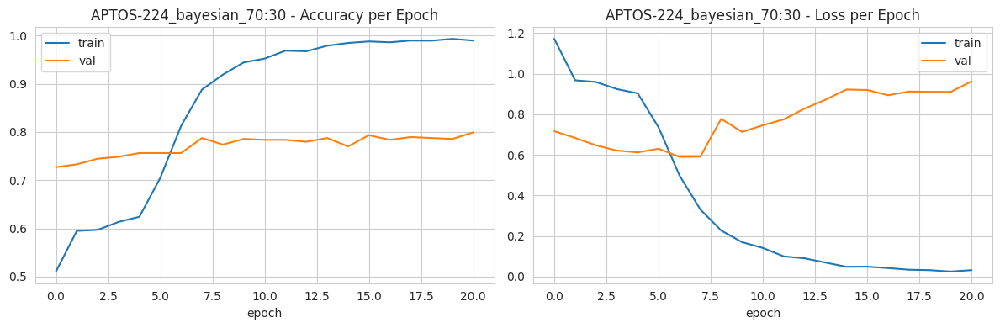

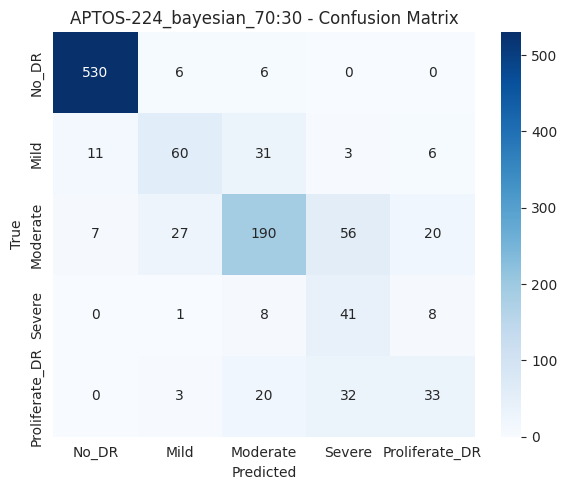


APTOS-224_bayesian_70:30: Acc=0.7771 | Precision(macro)=0.6268 | Sensitivity(macro)=0.6467 | Specificity(macro)=0.9456 | QWK=0.8701
Semua output tersimpan di: /content/drive/MyDrive/BayesianCNN/Experiments/APTOS-224_bayesian_70:30

EKSPERIMEN: Lokal_deterministic_70:30 (deterministic, split 70:30)
Train (oversampled): 430 | Val: 49 | Test: 106


Precompute cache:   0%|          | 0/192 [00:00<?, ?it/s]

Selesai: 192 gambar baru di-cache, 0 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/49 [00:00<?, ?it/s]

Selesai: 49 gambar baru di-cache, 0 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/106 [00:00<?, ?it/s]

Selesai: 106 gambar baru di-cache, 0 sudah ada (skip), 0 gagal.


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 01/5] train_loss=1.3200 val_loss=1.4171 | train_acc=0.4326 val_acc=0.3469 | train_qwk=0.3780 val_qwk=0.2836


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 02/5] train_loss=0.9086 val_loss=1.2518 | train_acc=0.6651 val_acc=0.4286 | train_qwk=0.6412 val_qwk=0.3687


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 03/5] train_loss=0.6880 val_loss=1.1943 | train_acc=0.7442 val_acc=0.5102 | train_qwk=0.7514 val_qwk=0.4321


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 04/5] train_loss=0.5499 val_loss=1.1470 | train_acc=0.8163 val_acc=0.5510 | train_qwk=0.8042 val_qwk=0.5240


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 05/5] train_loss=0.4789 val_loss=1.1317 | train_acc=0.8488 val_acc=0.5306 | train_qwk=0.8509 val_qwk=0.5636


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 01/45] train_loss=0.4252 val_loss=1.0205 | train_acc=0.8674 val_acc=0.5714 | train_qwk=0.8673 val_qwk=0.6496 | lr=1.00e-04


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 02/45] train_loss=0.2870 val_loss=0.9744 | train_acc=0.9093 val_acc=0.6122 | train_qwk=0.8963 val_qwk=0.4946 | lr=1.00e-04


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 03/45] train_loss=0.2080 val_loss=0.9650 | train_acc=0.9512 val_acc=0.6122 | train_qwk=0.9518 val_qwk=0.5476 | lr=1.00e-04


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 04/45] train_loss=0.1550 val_loss=0.9316 | train_acc=0.9721 val_acc=0.5918 | train_qwk=0.9785 val_qwk=0.4979 | lr=1.00e-04


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 05/45] train_loss=0.1024 val_loss=0.9742 | train_acc=0.9860 val_acc=0.6327 | train_qwk=0.9865 val_qwk=0.6283 | lr=5.00e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 06/45] train_loss=0.0777 val_loss=0.9797 | train_acc=0.9837 val_acc=0.6735 | train_qwk=0.9907 val_qwk=0.5359 | lr=5.00e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 07/45] train_loss=0.0692 val_loss=0.9730 | train_acc=0.9884 val_acc=0.6735 | train_qwk=0.9936 val_qwk=0.5359 | lr=5.00e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 08/45] train_loss=0.0604 val_loss=0.9592 | train_acc=0.9907 val_acc=0.6531 | train_qwk=0.9925 val_qwk=0.5279 | lr=5.00e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 09/45] train_loss=0.0447 val_loss=0.9566 | train_acc=0.9884 val_acc=0.6531 | train_qwk=0.9872 val_qwk=0.5618 | lr=2.50e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 10/45] train_loss=0.0415 val_loss=0.9725 | train_acc=0.9953 val_acc=0.6531 | train_qwk=0.9971 val_qwk=0.5618 | lr=2.50e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 11/45] train_loss=0.0413 val_loss=0.9935 | train_acc=0.9930 val_acc=0.6122 | train_qwk=0.9947 val_qwk=0.5137 | lr=2.50e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 12/45] train_loss=0.0336 val_loss=1.0233 | train_acc=0.9977 val_acc=0.6327 | train_qwk=0.9994 val_qwk=0.5220 | lr=2.50e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 13/45] train_loss=0.0287 val_loss=1.0358 | train_acc=1.0000 val_acc=0.6531 | train_qwk=1.0000 val_qwk=0.5618 | lr=1.25e-05
[EARLY STOPPING] epoch 13
Checkpoint terbaik: epoch 1 (fase 2, val_qwk=0.6496)
Model terbaik disalin ke: /content/drive/MyDrive/BayesianCNN/Experiments/Lokal_deterministic_70:30/best_model.pt


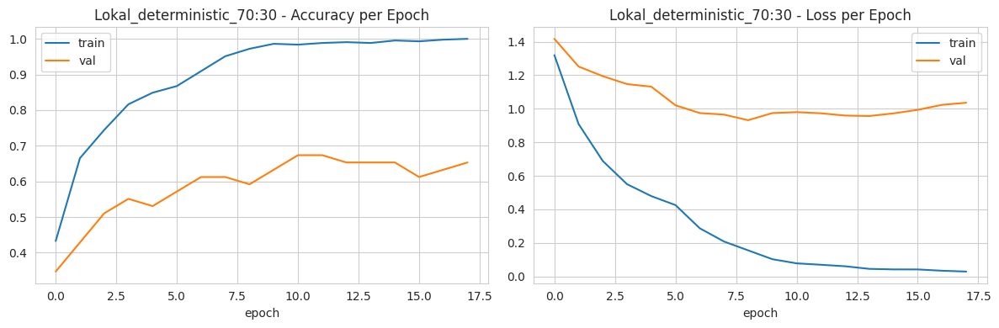

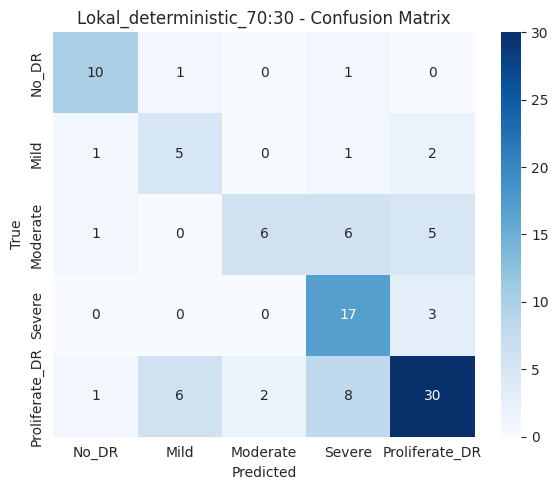


Lokal_deterministic_70:30: Acc=0.6415 | Precision(macro)=0.6402 | Sensitivity(macro)=0.6421 | Specificity(macro)=0.9035 | QWK=0.6269
Semua output tersimpan di: /content/drive/MyDrive/BayesianCNN/Experiments/Lokal_deterministic_70:30

EKSPERIMEN: Lokal_bayesian_70:30 (bayesian, split 70:30)
Train (oversampled): 430 | Val: 49 | Test: 106


Precompute cache:   0%|          | 0/192 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 192 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/49 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 49 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/106 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 106 sudah ada (skip), 0 gagal.


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 01/5] train_loss=1.5239 val_loss=1.4838 | train_acc=0.2837 val_acc=0.4694 | train_qwk=0.2284 val_qwk=0.4206


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 02/5] train_loss=1.2534 val_loss=1.3745 | train_acc=0.5233 val_acc=0.4694 | train_qwk=0.5577 val_qwk=0.3708


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 03/5] train_loss=1.1239 val_loss=1.3272 | train_acc=0.5814 val_acc=0.4490 | train_qwk=0.6005 val_qwk=0.3532


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 04/5] train_loss=1.0347 val_loss=1.3091 | train_acc=0.5977 val_acc=0.4286 | train_qwk=0.6001 val_qwk=0.3346


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 05/5] train_loss=0.9911 val_loss=1.3073 | train_acc=0.6349 val_acc=0.3878 | train_qwk=0.6508 val_qwk=0.2880


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 01/45] train_loss=0.8949 val_loss=1.1472 | train_acc=0.6698 val_acc=0.5510 | train_qwk=0.6592 val_qwk=0.6211 | lr=1.00e-04


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 02/45] train_loss=0.7466 val_loss=1.1489 | train_acc=0.7233 val_acc=0.5714 | train_qwk=0.7720 val_qwk=0.6962 | lr=1.00e-04


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 03/45] train_loss=0.6261 val_loss=1.0907 | train_acc=0.8047 val_acc=0.5918 | train_qwk=0.8320 val_qwk=0.5264 | lr=1.00e-04


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 04/45] train_loss=0.4969 val_loss=1.0042 | train_acc=0.8651 val_acc=0.6531 | train_qwk=0.8726 val_qwk=0.5701 | lr=1.00e-04


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 05/45] train_loss=0.4206 val_loss=0.9115 | train_acc=0.8814 val_acc=0.6939 | train_qwk=0.8750 val_qwk=0.5875 | lr=1.00e-04


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 06/45] train_loss=0.3339 val_loss=0.9180 | train_acc=0.9233 val_acc=0.6531 | train_qwk=0.9361 val_qwk=0.5644 | lr=5.00e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 07/45] train_loss=0.2777 val_loss=0.9130 | train_acc=0.9419 val_acc=0.6327 | train_qwk=0.9520 val_qwk=0.5499 | lr=5.00e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 08/45] train_loss=0.2513 val_loss=0.8852 | train_acc=0.9535 val_acc=0.6327 | train_qwk=0.9530 val_qwk=0.5499 | lr=5.00e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 09/45] train_loss=0.1955 val_loss=0.8759 | train_acc=0.9605 val_acc=0.6531 | train_qwk=0.9706 val_qwk=0.5580 | lr=5.00e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 10/45] train_loss=0.1583 val_loss=0.8727 | train_acc=0.9791 val_acc=0.6531 | train_qwk=0.9837 val_qwk=0.5569 | lr=2.50e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 11/45] train_loss=0.1491 val_loss=0.8817 | train_acc=0.9791 val_acc=0.6735 | train_qwk=0.9895 val_qwk=0.5965 | lr=2.50e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 12/45] train_loss=0.1429 val_loss=0.8843 | train_acc=0.9814 val_acc=0.6735 | train_qwk=0.9843 val_qwk=0.5965 | lr=2.50e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 13/45] train_loss=0.1334 val_loss=0.8797 | train_acc=0.9814 val_acc=0.6735 | train_qwk=0.9873 val_qwk=0.5965 | lr=2.50e-05


Train:   0%|          | 0/7 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 14/45] train_loss=0.1246 val_loss=0.8727 | train_acc=0.9791 val_acc=0.6939 | train_qwk=0.9836 val_qwk=0.6136 | lr=1.25e-05
[EARLY STOPPING] epoch 14
Checkpoint terbaik: epoch 2 (fase 2, val_qwk=0.6962)
Model terbaik disalin ke: /content/drive/MyDrive/BayesianCNN/Experiments/Lokal_bayesian_70:30/best_model.pt


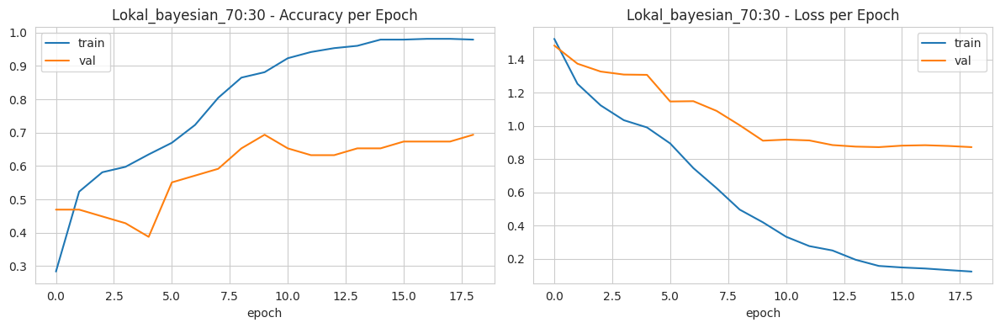

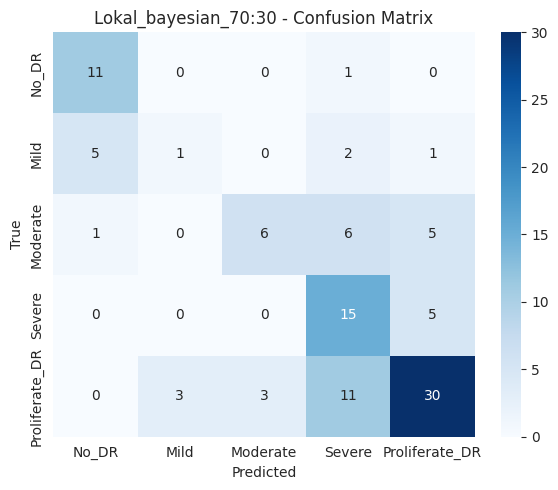


Lokal_bayesian_70:30: Acc=0.5943 | Precision(macro)=0.5448 | Sensitivity(macro)=0.5499 | Specificity(macro)=0.8904 | QWK=0.7207
Semua output tersimpan di: /content/drive/MyDrive/BayesianCNN/Experiments/Lokal_bayesian_70:30

EKSPERIMEN: APTOS-224_deterministic_80:20 (deterministic, split 80:20)
Train (oversampled): 5775 | Val: 586 | Test: 733


Precompute cache:   0%|          | 0/2225 [00:00<?, ?it/s]

Selesai: 73 gambar baru di-cache, 2152 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/586 [00:00<?, ?it/s]

Selesai: 18 gambar baru di-cache, 568 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/733 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 733 sudah ada (skip), 0 gagal.


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P1 01/5] train_loss=0.8348 val_loss=0.6639 | train_acc=0.6753 val_acc=0.7321 | train_qwk=0.7785 val_qwk=0.8102


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P1 02/5] train_loss=0.5780 val_loss=0.7074 | train_acc=0.7822 val_acc=0.7440 | train_qwk=0.8664 val_qwk=0.8457


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P1 03/5] train_loss=0.4839 val_loss=0.6950 | train_acc=0.8178 val_acc=0.7474 | train_qwk=0.8915 val_qwk=0.8425


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P1 04/5] train_loss=0.4190 val_loss=0.7612 | train_acc=0.8443 val_acc=0.7440 | train_qwk=0.9054 val_qwk=0.8523


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P1 05/5] train_loss=0.3616 val_loss=0.6858 | train_acc=0.8694 val_acc=0.7816 | train_qwk=0.9184 val_qwk=0.8672


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 01/45] train_loss=0.3034 val_loss=0.6992 | train_acc=0.8954 val_acc=0.7662 | train_qwk=0.9337 val_qwk=0.8755 | lr=1.00e-04


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 02/45] train_loss=0.1858 val_loss=0.7049 | train_acc=0.9392 val_acc=0.7867 | train_qwk=0.9677 val_qwk=0.8642 | lr=1.00e-04


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 03/45] train_loss=0.1399 val_loss=0.7019 | train_acc=0.9577 val_acc=0.7850 | train_qwk=0.9755 val_qwk=0.8623 | lr=1.00e-04


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 04/45] train_loss=0.1060 val_loss=0.7383 | train_acc=0.9692 val_acc=0.7986 | train_qwk=0.9828 val_qwk=0.8615 | lr=1.00e-04


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 05/45] train_loss=0.0823 val_loss=0.7410 | train_acc=0.9775 val_acc=0.8020 | train_qwk=0.9868 val_qwk=0.8653 | lr=5.00e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 06/45] train_loss=0.0607 val_loss=0.7041 | train_acc=0.9842 val_acc=0.8038 | train_qwk=0.9919 val_qwk=0.8646 | lr=5.00e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 07/45] train_loss=0.0516 val_loss=0.7292 | train_acc=0.9848 val_acc=0.8072 | train_qwk=0.9916 val_qwk=0.8714 | lr=5.00e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 08/45] train_loss=0.0436 val_loss=0.7398 | train_acc=0.9886 val_acc=0.8055 | train_qwk=0.9944 val_qwk=0.8717 | lr=5.00e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 09/45] train_loss=0.0430 val_loss=0.7438 | train_acc=0.9872 val_acc=0.7952 | train_qwk=0.9940 val_qwk=0.8611 | lr=2.50e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 10/45] train_loss=0.0393 val_loss=0.7385 | train_acc=0.9894 val_acc=0.8020 | train_qwk=0.9929 val_qwk=0.8743 | lr=2.50e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 11/45] train_loss=0.0359 val_loss=0.7840 | train_acc=0.9891 val_acc=0.7935 | train_qwk=0.9942 val_qwk=0.8732 | lr=2.50e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 12/45] train_loss=0.0313 val_loss=0.8065 | train_acc=0.9908 val_acc=0.7969 | train_qwk=0.9938 val_qwk=0.8626 | lr=2.50e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 13/45] train_loss=0.0283 val_loss=0.7932 | train_acc=0.9912 val_acc=0.7986 | train_qwk=0.9945 val_qwk=0.8705 | lr=1.25e-05
[EARLY STOPPING] epoch 13
Checkpoint terbaik: epoch 1 (fase 2, val_qwk=0.8755)
Model terbaik disalin ke: /content/drive/MyDrive/BayesianCNN/Experiments/APTOS-224_deterministic_80:20/best_model.pt


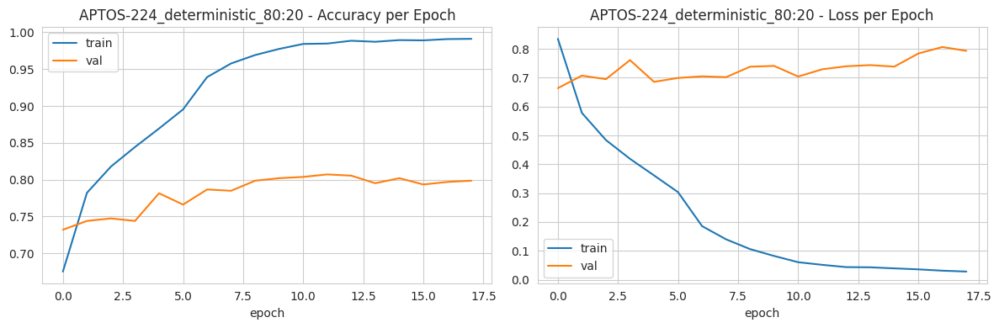

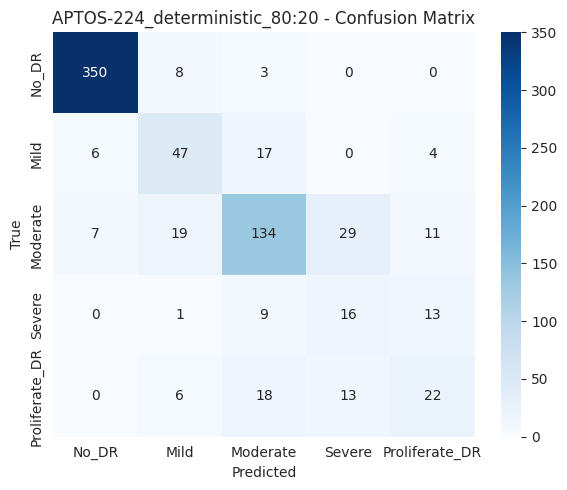


APTOS-224_deterministic_80:20: Acc=0.7763 | Precision(macro)=0.6001 | Sensitivity(macro)=0.6116 | Specificity(macro)=0.9446 | QWK=0.8516
Semua output tersimpan di: /content/drive/MyDrive/BayesianCNN/Experiments/APTOS-224_deterministic_80:20

EKSPERIMEN: APTOS-224_bayesian_80:20 (bayesian, split 80:20)
Train (oversampled): 5775 | Val: 586 | Test: 733


Precompute cache:   0%|          | 0/2225 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 2225 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/586 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 586 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/733 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 733 sudah ada (skip), 0 gagal.


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P1 01/5] train_loss=1.1217 val_loss=0.6866 | train_acc=0.5392 val_acc=0.7389 | train_qwk=0.6426 val_qwk=0.8000


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P1 02/5] train_loss=0.9547 val_loss=0.6622 | train_acc=0.6114 val_acc=0.7389 | train_qwk=0.7273 val_qwk=0.8074


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P1 03/5] train_loss=0.9202 val_loss=0.6582 | train_acc=0.6175 val_acc=0.7440 | train_qwk=0.7336 val_qwk=0.8123


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P1 04/5] train_loss=0.9105 val_loss=0.6354 | train_acc=0.6286 val_acc=0.7560 | train_qwk=0.7400 val_qwk=0.8115


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P1 05/5] train_loss=0.8859 val_loss=0.6697 | train_acc=0.6412 val_acc=0.7287 | train_qwk=0.7500 val_qwk=0.7825


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 01/45] train_loss=0.7202 val_loss=0.6321 | train_acc=0.7106 val_acc=0.7611 | train_qwk=0.8199 val_qwk=0.8522 | lr=1.00e-04


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 02/45] train_loss=0.4907 val_loss=0.6451 | train_acc=0.8159 val_acc=0.7662 | train_qwk=0.8947 val_qwk=0.8574 | lr=1.00e-04


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 03/45] train_loss=0.3403 val_loss=0.6550 | train_acc=0.8809 val_acc=0.7799 | train_qwk=0.9347 val_qwk=0.8883 | lr=1.00e-04


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 04/45] train_loss=0.2543 val_loss=0.6328 | train_acc=0.9126 val_acc=0.7867 | train_qwk=0.9535 val_qwk=0.8829 | lr=1.00e-04


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 05/45] train_loss=0.1844 val_loss=0.7023 | train_acc=0.9397 val_acc=0.7850 | train_qwk=0.9694 val_qwk=0.8797 | lr=1.00e-04


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 06/45] train_loss=0.1644 val_loss=0.7531 | train_acc=0.9455 val_acc=0.7850 | train_qwk=0.9704 val_qwk=0.8655 | lr=1.00e-04


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 07/45] train_loss=0.1262 val_loss=0.8186 | train_acc=0.9607 val_acc=0.8038 | train_qwk=0.9800 val_qwk=0.8737 | lr=5.00e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 08/45] train_loss=0.0926 val_loss=0.7608 | train_acc=0.9707 val_acc=0.8089 | train_qwk=0.9850 val_qwk=0.8718 | lr=5.00e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 09/45] train_loss=0.0690 val_loss=0.7586 | train_acc=0.9785 val_acc=0.8072 | train_qwk=0.9883 val_qwk=0.8733 | lr=5.00e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 10/45] train_loss=0.0648 val_loss=0.7306 | train_acc=0.9803 val_acc=0.8225 | train_qwk=0.9881 val_qwk=0.8909 | lr=5.00e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 11/45] train_loss=0.0634 val_loss=0.8232 | train_acc=0.9796 val_acc=0.8140 | train_qwk=0.9874 val_qwk=0.8870 | lr=5.00e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 12/45] train_loss=0.0489 val_loss=0.7617 | train_acc=0.9837 val_acc=0.8242 | train_qwk=0.9912 val_qwk=0.8955 | lr=5.00e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 13/45] train_loss=0.0483 val_loss=0.7890 | train_acc=0.9855 val_acc=0.8157 | train_qwk=0.9914 val_qwk=0.8867 | lr=5.00e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 14/45] train_loss=0.0488 val_loss=0.8188 | train_acc=0.9846 val_acc=0.8140 | train_qwk=0.9906 val_qwk=0.8799 | lr=5.00e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 15/45] train_loss=0.0512 val_loss=0.8774 | train_acc=0.9830 val_acc=0.8055 | train_qwk=0.9905 val_qwk=0.8767 | lr=5.00e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 16/45] train_loss=0.0471 val_loss=0.8576 | train_acc=0.9834 val_acc=0.8106 | train_qwk=0.9911 val_qwk=0.8772 | lr=2.50e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 17/45] train_loss=0.0407 val_loss=0.8176 | train_acc=0.9865 val_acc=0.8174 | train_qwk=0.9916 val_qwk=0.8824 | lr=2.50e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 18/45] train_loss=0.0362 val_loss=0.8895 | train_acc=0.9887 val_acc=0.8174 | train_qwk=0.9930 val_qwk=0.8717 | lr=2.50e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 19/45] train_loss=0.0341 val_loss=0.8076 | train_acc=0.9889 val_acc=0.8345 | train_qwk=0.9940 val_qwk=0.8940 | lr=2.50e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 20/45] train_loss=0.0331 val_loss=0.8549 | train_acc=0.9884 val_acc=0.8191 | train_qwk=0.9928 val_qwk=0.8777 | lr=1.25e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 21/45] train_loss=0.0305 val_loss=0.8798 | train_acc=0.9882 val_acc=0.8276 | train_qwk=0.9933 val_qwk=0.8827 | lr=1.25e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 22/45] train_loss=0.0279 val_loss=0.8769 | train_acc=0.9889 val_acc=0.8276 | train_qwk=0.9948 val_qwk=0.8801 | lr=1.25e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 23/45] train_loss=0.0277 val_loss=0.8719 | train_acc=0.9889 val_acc=0.8242 | train_qwk=0.9945 val_qwk=0.8914 | lr=1.25e-05


Train:   0%|          | 0/91 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[P2 24/45] train_loss=0.0299 val_loss=0.8779 | train_acc=0.9889 val_acc=0.8379 | train_qwk=0.9934 val_qwk=0.8935 | lr=6.25e-06
[EARLY STOPPING] epoch 24
Checkpoint terbaik: epoch 12 (fase 2, val_qwk=0.8955)
Model terbaik disalin ke: /content/drive/MyDrive/BayesianCNN/Experiments/APTOS-224_bayesian_80:20/best_model.pt


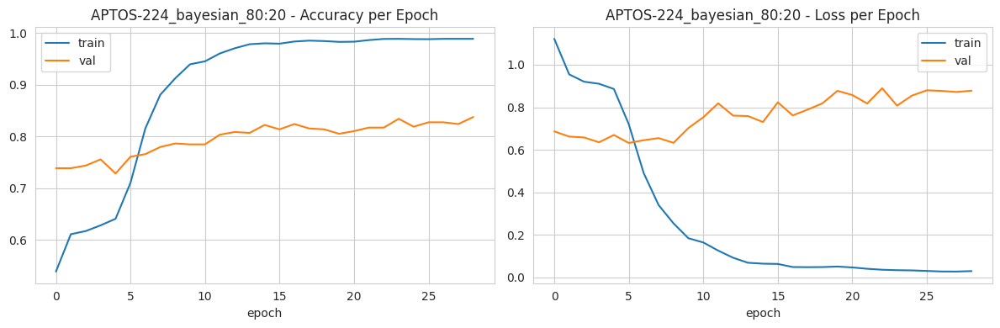

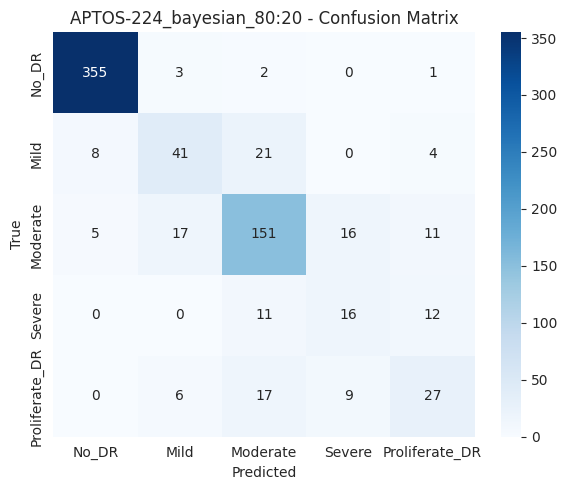


APTOS-224_bayesian_80:20: Acc=0.8049 | Precision(macro)=0.6411 | Sensitivity(macro)=0.6321 | Specificity(macro)=0.9505 | QWK=0.8604
Semua output tersimpan di: /content/drive/MyDrive/BayesianCNN/Experiments/APTOS-224_bayesian_80:20

EKSPERIMEN: Lokal_deterministic_80:20 (deterministic, split 80:20)
Train (oversampled): 495 | Val: 56 | Test: 71


Precompute cache:   0%|          | 0/220 [00:00<?, ?it/s]

Selesai: 3 gambar baru di-cache, 217 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/56 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 56 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/71 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 71 sudah ada (skip), 0 gagal.


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 01/5] train_loss=1.3106 val_loss=1.3616 | train_acc=0.4667 val_acc=0.4107 | train_qwk=0.4849 val_qwk=0.4116


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 02/5] train_loss=0.9253 val_loss=1.1950 | train_acc=0.6606 val_acc=0.5179 | train_qwk=0.6141 val_qwk=0.5017


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 03/5] train_loss=0.7056 val_loss=1.1639 | train_acc=0.7374 val_acc=0.5714 | train_qwk=0.6947 val_qwk=0.4597


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 04/5] train_loss=0.5525 val_loss=1.1948 | train_acc=0.8202 val_acc=0.5357 | train_qwk=0.8495 val_qwk=0.4060


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 05/5] train_loss=0.5043 val_loss=1.1240 | train_acc=0.8424 val_acc=0.5357 | train_qwk=0.8569 val_qwk=0.5618


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 01/45] train_loss=0.4377 val_loss=0.9292 | train_acc=0.8727 val_acc=0.6607 | train_qwk=0.8737 val_qwk=0.5360 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 02/45] train_loss=0.2977 val_loss=0.9640 | train_acc=0.9071 val_acc=0.6429 | train_qwk=0.9104 val_qwk=0.6543 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 03/45] train_loss=0.2108 val_loss=0.9276 | train_acc=0.9495 val_acc=0.6607 | train_qwk=0.9575 val_qwk=0.6851 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 04/45] train_loss=0.1559 val_loss=0.7803 | train_acc=0.9657 val_acc=0.7321 | train_qwk=0.9751 val_qwk=0.7154 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 05/45] train_loss=0.1041 val_loss=0.7074 | train_acc=0.9859 val_acc=0.7679 | train_qwk=0.9904 val_qwk=0.7554 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 06/45] train_loss=0.0881 val_loss=0.7040 | train_acc=0.9818 val_acc=0.7857 | train_qwk=0.9894 val_qwk=0.8555 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 07/45] train_loss=0.0658 val_loss=0.7216 | train_acc=0.9879 val_acc=0.8036 | train_qwk=0.9863 val_qwk=0.8113 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 08/45] train_loss=0.0579 val_loss=0.7502 | train_acc=0.9919 val_acc=0.7679 | train_qwk=0.9934 val_qwk=0.7570 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 09/45] train_loss=0.0352 val_loss=0.7580 | train_acc=0.9939 val_acc=0.7500 | train_qwk=0.9940 val_qwk=0.7294 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 10/45] train_loss=0.0300 val_loss=0.7656 | train_acc=0.9980 val_acc=0.7679 | train_qwk=0.9980 val_qwk=0.7456 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 11/45] train_loss=0.0233 val_loss=0.8063 | train_acc=0.9980 val_acc=0.7500 | train_qwk=0.9995 val_qwk=0.7273 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 12/45] train_loss=0.0196 val_loss=0.7817 | train_acc=1.0000 val_acc=0.7679 | train_qwk=1.0000 val_qwk=0.7456 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 13/45] train_loss=0.0209 val_loss=0.7533 | train_acc=0.9960 val_acc=0.7679 | train_qwk=0.9960 val_qwk=0.7456 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 14/45] train_loss=0.0143 val_loss=0.7684 | train_acc=1.0000 val_acc=0.8036 | train_qwk=1.0000 val_qwk=0.7995 | lr=2.50e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 15/45] train_loss=0.0123 val_loss=0.8005 | train_acc=0.9980 val_acc=0.7679 | train_qwk=0.9980 val_qwk=0.7456 | lr=2.50e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 16/45] train_loss=0.0165 val_loss=0.7815 | train_acc=1.0000 val_acc=0.7857 | train_qwk=1.0000 val_qwk=0.7829 | lr=2.50e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 17/45] train_loss=0.0183 val_loss=0.7945 | train_acc=1.0000 val_acc=0.7857 | train_qwk=1.0000 val_qwk=0.7829 | lr=2.50e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 18/45] train_loss=0.0128 val_loss=0.7737 | train_acc=1.0000 val_acc=0.7679 | train_qwk=1.0000 val_qwk=0.7456 | lr=1.25e-05
[EARLY STOPPING] epoch 18
Checkpoint terbaik: epoch 6 (fase 2, val_qwk=0.8555)
Model terbaik disalin ke: /content/drive/MyDrive/BayesianCNN/Experiments/Lokal_deterministic_80:20/best_model.pt


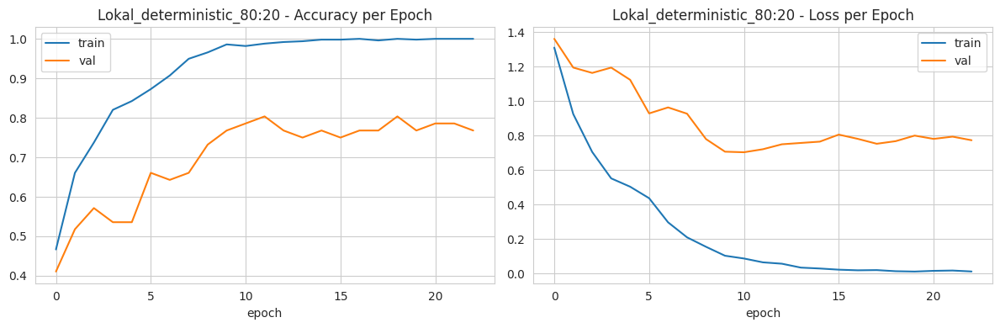

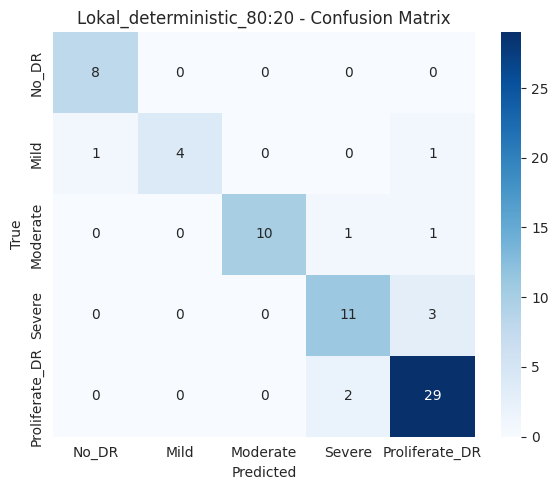


Lokal_deterministic_80:20: Acc=0.8732 | Precision(macro)=0.9055 | Sensitivity(macro)=0.8442 | Specificity(macro)=0.9613 | QWK=0.9272
Semua output tersimpan di: /content/drive/MyDrive/BayesianCNN/Experiments/Lokal_deterministic_80:20

EKSPERIMEN: Lokal_bayesian_80:20 (bayesian, split 80:20)
Train (oversampled): 495 | Val: 56 | Test: 71


Precompute cache:   0%|          | 0/220 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 220 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/56 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 56 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/71 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 71 sudah ada (skip), 0 gagal.


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 01/5] train_loss=1.5067 val_loss=1.4791 | train_acc=0.3495 val_acc=0.4286 | train_qwk=0.3240 val_qwk=0.3774


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 02/5] train_loss=1.2807 val_loss=1.3267 | train_acc=0.4727 val_acc=0.5893 | train_qwk=0.5052 val_qwk=0.6565


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 03/5] train_loss=1.1512 val_loss=1.2663 | train_acc=0.5434 val_acc=0.5179 | train_qwk=0.5534 val_qwk=0.5532


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 04/5] train_loss=1.0692 val_loss=1.2385 | train_acc=0.5859 val_acc=0.5357 | train_qwk=0.5869 val_qwk=0.5260


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 05/5] train_loss=1.0092 val_loss=1.1946 | train_acc=0.6141 val_acc=0.5536 | train_qwk=0.6349 val_qwk=0.5491


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 01/45] train_loss=0.9142 val_loss=1.1452 | train_acc=0.6505 val_acc=0.5714 | train_qwk=0.6288 val_qwk=0.5844 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 02/45] train_loss=0.7482 val_loss=1.0296 | train_acc=0.7354 val_acc=0.5714 | train_qwk=0.7844 val_qwk=0.6073 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 03/45] train_loss=0.5888 val_loss=0.9624 | train_acc=0.8081 val_acc=0.6071 | train_qwk=0.8274 val_qwk=0.5729 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 04/45] train_loss=0.4893 val_loss=0.9153 | train_acc=0.8465 val_acc=0.6071 | train_qwk=0.8892 val_qwk=0.6814 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 05/45] train_loss=0.4006 val_loss=0.8037 | train_acc=0.8687 val_acc=0.7143 | train_qwk=0.8884 val_qwk=0.6976 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 06/45] train_loss=0.3207 val_loss=0.7036 | train_acc=0.9253 val_acc=0.7679 | train_qwk=0.9521 val_qwk=0.7854 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 07/45] train_loss=0.2575 val_loss=0.6317 | train_acc=0.9374 val_acc=0.8036 | train_qwk=0.9505 val_qwk=0.8098 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 08/45] train_loss=0.1984 val_loss=0.6484 | train_acc=0.9636 val_acc=0.7857 | train_qwk=0.9730 val_qwk=0.7930 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 09/45] train_loss=0.1544 val_loss=0.6322 | train_acc=0.9697 val_acc=0.8036 | train_qwk=0.9809 val_qwk=0.8234 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 10/45] train_loss=0.1279 val_loss=0.6332 | train_acc=0.9758 val_acc=0.7857 | train_qwk=0.9877 val_qwk=0.7946 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 11/45] train_loss=0.1010 val_loss=0.6722 | train_acc=0.9838 val_acc=0.7857 | train_qwk=0.9900 val_qwk=0.7829 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 12/45] train_loss=0.0845 val_loss=0.7134 | train_acc=0.9919 val_acc=0.8036 | train_qwk=0.9950 val_qwk=0.8234 | lr=1.00e-04


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 13/45] train_loss=0.0831 val_loss=0.6098 | train_acc=0.9859 val_acc=0.8036 | train_qwk=0.9934 val_qwk=0.7995 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 14/45] train_loss=0.0589 val_loss=0.6022 | train_acc=0.9960 val_acc=0.8214 | train_qwk=0.9975 val_qwk=0.8682 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 15/45] train_loss=0.0511 val_loss=0.6715 | train_acc=0.9960 val_acc=0.8036 | train_qwk=0.9959 val_qwk=0.8753 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 16/45] train_loss=0.0386 val_loss=0.7101 | train_acc=0.9939 val_acc=0.8036 | train_qwk=0.9970 val_qwk=0.8512 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 17/45] train_loss=0.0372 val_loss=0.7279 | train_acc=0.9960 val_acc=0.8036 | train_qwk=0.9990 val_qwk=0.8512 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 18/45] train_loss=0.0390 val_loss=0.7170 | train_acc=0.9960 val_acc=0.8214 | train_qwk=0.9934 val_qwk=0.8682 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 19/45] train_loss=0.0352 val_loss=0.6982 | train_acc=0.9960 val_acc=0.8214 | train_qwk=0.9959 val_qwk=0.8806 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 20/45] train_loss=0.0331 val_loss=0.7159 | train_acc=0.9960 val_acc=0.8036 | train_qwk=0.9990 val_qwk=0.8780 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 21/45] train_loss=0.0326 val_loss=0.7118 | train_acc=0.9960 val_acc=0.8214 | train_qwk=0.9949 val_qwk=0.8282 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 22/45] train_loss=0.0295 val_loss=0.7086 | train_acc=0.9980 val_acc=0.8214 | train_qwk=0.9995 val_qwk=0.8282 | lr=5.00e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 23/45] train_loss=0.0199 val_loss=0.7408 | train_acc=1.0000 val_acc=0.8036 | train_qwk=1.0000 val_qwk=0.8500 | lr=2.50e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 24/45] train_loss=0.0260 val_loss=0.7450 | train_acc=0.9980 val_acc=0.8036 | train_qwk=0.9995 val_qwk=0.8500 | lr=2.50e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 25/45] train_loss=0.0233 val_loss=0.7895 | train_acc=0.9980 val_acc=0.8036 | train_qwk=0.9995 val_qwk=0.8500 | lr=2.50e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 26/45] train_loss=0.0249 val_loss=0.8090 | train_acc=0.9980 val_acc=0.8036 | train_qwk=0.9980 val_qwk=0.7978 | lr=2.50e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 27/45] train_loss=0.0287 val_loss=0.7635 | train_acc=0.9919 val_acc=0.8036 | train_qwk=0.9965 val_qwk=0.8500 | lr=1.25e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 28/45] train_loss=0.0297 val_loss=0.7564 | train_acc=0.9960 val_acc=0.8036 | train_qwk=0.9959 val_qwk=0.8500 | lr=1.25e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 29/45] train_loss=0.0171 val_loss=0.7700 | train_acc=1.0000 val_acc=0.8036 | train_qwk=1.0000 val_qwk=0.8500 | lr=1.25e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 30/45] train_loss=0.0180 val_loss=0.7579 | train_acc=1.0000 val_acc=0.8036 | train_qwk=1.0000 val_qwk=0.8500 | lr=1.25e-05


Train:   0%|          | 0/8 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 31/45] train_loss=0.0221 val_loss=0.7577 | train_acc=0.9980 val_acc=0.8036 | train_qwk=0.9980 val_qwk=0.8500 | lr=6.25e-06
[EARLY STOPPING] epoch 31
Checkpoint terbaik: epoch 19 (fase 2, val_qwk=0.8806)
Model terbaik disalin ke: /content/drive/MyDrive/BayesianCNN/Experiments/Lokal_bayesian_80:20/best_model.pt


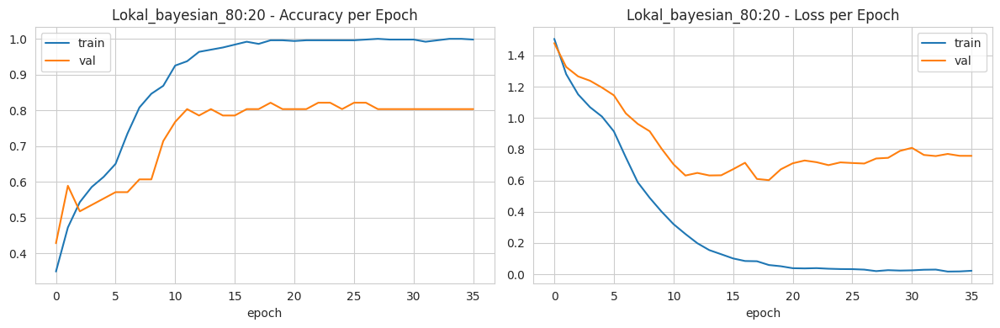

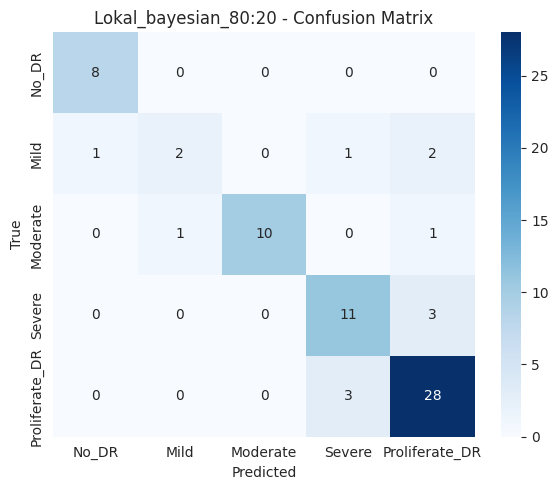


Lokal_bayesian_80:20: Acc=0.8310 | Precision(macro)=0.8225 | Sensitivity(macro)=0.7711 | Specificity(macro)=0.9497 | QWK=0.8749
Semua output tersimpan di: /content/drive/MyDrive/BayesianCNN/Experiments/Lokal_bayesian_80:20

EKSPERIMEN: APTOS-224_deterministic_90:10 (deterministic, split 90:10)
Train (oversampled): 6495 | Val: 659 | Test: 367


Precompute cache:   0%|          | 0/2508 [00:00<?, ?it/s]

Selesai: 9 gambar baru di-cache, 2499 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/659 [00:00<?, ?it/s]

Selesai: 1 gambar baru di-cache, 658 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/367 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 367 sudah ada (skip), 0 gagal.


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P1 01/5] train_loss=0.8519 val_loss=0.5875 | train_acc=0.6627 val_acc=0.7648 | train_qwk=0.7682 val_qwk=0.8309


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P1 02/5] train_loss=0.6060 val_loss=0.6722 | train_acc=0.7683 val_acc=0.7572 | train_qwk=0.8525 val_qwk=0.8424


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P1 03/5] train_loss=0.4953 val_loss=0.5995 | train_acc=0.8143 val_acc=0.7800 | train_qwk=0.8844 val_qwk=0.8687


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P1 04/5] train_loss=0.4071 val_loss=0.7241 | train_acc=0.8460 val_acc=0.7375 | train_qwk=0.9011 val_qwk=0.8584


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P1 05/5] train_loss=0.3583 val_loss=0.6405 | train_acc=0.8671 val_acc=0.7739 | train_qwk=0.9204 val_qwk=0.8516


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 01/45] train_loss=0.3027 val_loss=0.6891 | train_acc=0.8931 val_acc=0.7845 | train_qwk=0.9308 val_qwk=0.8827 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 02/45] train_loss=0.1818 val_loss=0.6724 | train_acc=0.9413 val_acc=0.7967 | train_qwk=0.9656 val_qwk=0.8933 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 03/45] train_loss=0.1242 val_loss=0.6158 | train_acc=0.9641 val_acc=0.8209 | train_qwk=0.9808 val_qwk=0.8956 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 04/45] train_loss=0.0968 val_loss=0.6799 | train_acc=0.9743 val_acc=0.8179 | train_qwk=0.9884 val_qwk=0.8988 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 05/45] train_loss=0.0834 val_loss=0.7514 | train_acc=0.9747 val_acc=0.8285 | train_qwk=0.9890 val_qwk=0.8866 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 06/45] train_loss=0.0686 val_loss=0.7251 | train_acc=0.9828 val_acc=0.8300 | train_qwk=0.9928 val_qwk=0.8975 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 07/45] train_loss=0.0641 val_loss=0.7396 | train_acc=0.9820 val_acc=0.8270 | train_qwk=0.9910 val_qwk=0.8970 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 08/45] train_loss=0.0550 val_loss=0.7807 | train_acc=0.9861 val_acc=0.8346 | train_qwk=0.9919 val_qwk=0.9033 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 09/45] train_loss=0.0416 val_loss=0.7436 | train_acc=0.9877 val_acc=0.8346 | train_qwk=0.9946 val_qwk=0.9023 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 10/45] train_loss=0.0501 val_loss=0.7875 | train_acc=0.9860 val_acc=0.8164 | train_qwk=0.9940 val_qwk=0.8947 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 11/45] train_loss=0.0420 val_loss=0.8137 | train_acc=0.9875 val_acc=0.8164 | train_qwk=0.9935 val_qwk=0.8906 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 12/45] train_loss=0.0411 val_loss=0.7864 | train_acc=0.9877 val_acc=0.8376 | train_qwk=0.9943 val_qwk=0.9116 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 13/45] train_loss=0.0412 val_loss=0.8298 | train_acc=0.9874 val_acc=0.8316 | train_qwk=0.9948 val_qwk=0.9066 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 14/45] train_loss=0.0303 val_loss=0.8612 | train_acc=0.9897 val_acc=0.8270 | train_qwk=0.9951 val_qwk=0.9061 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 15/45] train_loss=0.0387 val_loss=0.9047 | train_acc=0.9874 val_acc=0.8073 | train_qwk=0.9951 val_qwk=0.8846 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 16/45] train_loss=0.0326 val_loss=0.8713 | train_acc=0.9891 val_acc=0.8225 | train_qwk=0.9959 val_qwk=0.9084 | lr=5.00e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 17/45] train_loss=0.0277 val_loss=0.9281 | train_acc=0.9912 val_acc=0.8179 | train_qwk=0.9963 val_qwk=0.8997 | lr=5.00e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 18/45] train_loss=0.0223 val_loss=0.9149 | train_acc=0.9912 val_acc=0.8240 | train_qwk=0.9964 val_qwk=0.8963 | lr=5.00e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 19/45] train_loss=0.0218 val_loss=0.9322 | train_acc=0.9915 val_acc=0.8240 | train_qwk=0.9967 val_qwk=0.8978 | lr=5.00e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 20/45] train_loss=0.0210 val_loss=0.9245 | train_acc=0.9923 val_acc=0.8194 | train_qwk=0.9964 val_qwk=0.8880 | lr=2.50e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 21/45] train_loss=0.0179 val_loss=0.9149 | train_acc=0.9931 val_acc=0.8300 | train_qwk=0.9972 val_qwk=0.8976 | lr=2.50e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 22/45] train_loss=0.0181 val_loss=0.8907 | train_acc=0.9934 val_acc=0.8316 | train_qwk=0.9974 val_qwk=0.9019 | lr=2.50e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 23/45] train_loss=0.0175 val_loss=0.8945 | train_acc=0.9928 val_acc=0.8376 | train_qwk=0.9969 val_qwk=0.9104 | lr=2.50e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 24/45] train_loss=0.0173 val_loss=0.9071 | train_acc=0.9934 val_acc=0.8270 | train_qwk=0.9971 val_qwk=0.9057 | lr=1.25e-05
[EARLY STOPPING] epoch 24
Checkpoint terbaik: epoch 12 (fase 2, val_qwk=0.9116)
Model terbaik disalin ke: /content/drive/MyDrive/BayesianCNN/Experiments/APTOS-224_deterministic_90:10/best_model.pt


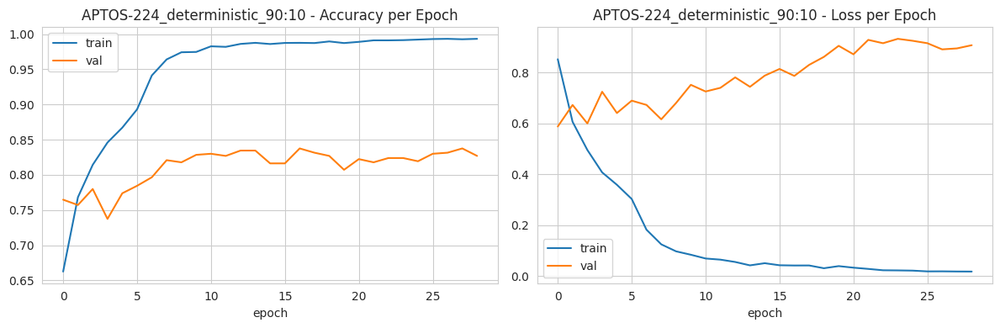

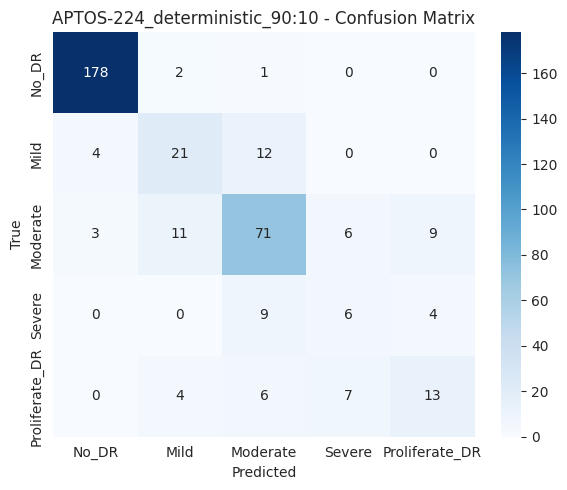


APTOS-224_deterministic_90:10: Acc=0.7875 | Precision(macro)=0.6096 | Sensitivity(macro)=0.6020 | Specificity(macro)=0.9460 | QWK=0.8624
Semua output tersimpan di: /content/drive/MyDrive/BayesianCNN/Experiments/APTOS-224_deterministic_90:10

EKSPERIMEN: APTOS-224_bayesian_90:10 (bayesian, split 90:10)
Train (oversampled): 6495 | Val: 659 | Test: 367


Precompute cache:   0%|          | 0/2508 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 2508 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/659 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 659 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/367 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 367 sudah ada (skip), 0 gagal.


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P1 01/5] train_loss=1.1236 val_loss=0.6408 | train_acc=0.5355 val_acc=0.7466 | train_qwk=0.6351 val_qwk=0.8119


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P1 02/5] train_loss=0.9850 val_loss=0.6218 | train_acc=0.5903 val_acc=0.7527 | train_qwk=0.7090 val_qwk=0.8280


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P1 03/5] train_loss=0.9390 val_loss=0.6158 | train_acc=0.6137 val_acc=0.7557 | train_qwk=0.7296 val_qwk=0.8137


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P1 04/5] train_loss=0.9220 val_loss=0.6029 | train_acc=0.6234 val_acc=0.7557 | train_qwk=0.7461 val_qwk=0.8276


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P1 05/5] train_loss=0.8944 val_loss=0.5744 | train_acc=0.6373 val_acc=0.7693 | train_qwk=0.7493 val_qwk=0.8337


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 01/45] train_loss=0.7409 val_loss=0.5556 | train_acc=0.7098 val_acc=0.7724 | train_qwk=0.8195 val_qwk=0.8675 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 02/45] train_loss=0.5128 val_loss=0.5484 | train_acc=0.8080 val_acc=0.7633 | train_qwk=0.8875 val_qwk=0.8687 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 03/45] train_loss=0.3575 val_loss=0.5828 | train_acc=0.8724 val_acc=0.7785 | train_qwk=0.9292 val_qwk=0.8707 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 04/45] train_loss=0.2657 val_loss=0.6310 | train_acc=0.9082 val_acc=0.7951 | train_qwk=0.9505 val_qwk=0.8621 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 05/45] train_loss=0.1922 val_loss=0.7011 | train_acc=0.9396 val_acc=0.7830 | train_qwk=0.9691 val_qwk=0.8780 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 06/45] train_loss=0.1516 val_loss=0.6666 | train_acc=0.9507 val_acc=0.7936 | train_qwk=0.9755 val_qwk=0.8798 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 07/45] train_loss=0.1307 val_loss=0.7349 | train_acc=0.9589 val_acc=0.7845 | train_qwk=0.9776 val_qwk=0.8741 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 08/45] train_loss=0.1121 val_loss=0.7446 | train_acc=0.9623 val_acc=0.8103 | train_qwk=0.9798 val_qwk=0.8805 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 09/45] train_loss=0.0992 val_loss=0.7344 | train_acc=0.9703 val_acc=0.8103 | train_qwk=0.9847 val_qwk=0.8907 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 10/45] train_loss=0.1063 val_loss=0.7562 | train_acc=0.9661 val_acc=0.8134 | train_qwk=0.9836 val_qwk=0.8802 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 11/45] train_loss=0.0791 val_loss=0.7696 | train_acc=0.9737 val_acc=0.8225 | train_qwk=0.9863 val_qwk=0.8934 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 12/45] train_loss=0.0688 val_loss=0.8844 | train_acc=0.9788 val_acc=0.8103 | train_qwk=0.9894 val_qwk=0.8722 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 13/45] train_loss=0.0579 val_loss=0.8336 | train_acc=0.9811 val_acc=0.8179 | train_qwk=0.9908 val_qwk=0.8903 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 14/45] train_loss=0.0589 val_loss=0.8980 | train_acc=0.9800 val_acc=0.8179 | train_qwk=0.9895 val_qwk=0.8818 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 15/45] train_loss=0.0580 val_loss=0.8931 | train_acc=0.9797 val_acc=0.8164 | train_qwk=0.9904 val_qwk=0.8963 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 16/45] train_loss=0.0565 val_loss=0.9231 | train_acc=0.9841 val_acc=0.8103 | train_qwk=0.9916 val_qwk=0.8952 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 17/45] train_loss=0.0699 val_loss=0.9227 | train_acc=0.9766 val_acc=0.8073 | train_qwk=0.9878 val_qwk=0.8810 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 18/45] train_loss=0.0550 val_loss=0.9587 | train_acc=0.9815 val_acc=0.7967 | train_qwk=0.9909 val_qwk=0.8725 | lr=1.00e-04


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 19/45] train_loss=0.0540 val_loss=1.0140 | train_acc=0.9815 val_acc=0.7967 | train_qwk=0.9914 val_qwk=0.8612 | lr=5.00e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 20/45] train_loss=0.0441 val_loss=0.9157 | train_acc=0.9837 val_acc=0.8088 | train_qwk=0.9915 val_qwk=0.8798 | lr=5.00e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 21/45] train_loss=0.0328 val_loss=0.9410 | train_acc=0.9889 val_acc=0.8088 | train_qwk=0.9953 val_qwk=0.8908 | lr=5.00e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 22/45] train_loss=0.0310 val_loss=0.9760 | train_acc=0.9898 val_acc=0.8088 | train_qwk=0.9956 val_qwk=0.8903 | lr=5.00e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 23/45] train_loss=0.0302 val_loss=0.9358 | train_acc=0.9897 val_acc=0.8088 | train_qwk=0.9948 val_qwk=0.8777 | lr=2.50e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 24/45] train_loss=0.0233 val_loss=0.9586 | train_acc=0.9920 val_acc=0.8118 | train_qwk=0.9963 val_qwk=0.8869 | lr=2.50e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 25/45] train_loss=0.0250 val_loss=0.9512 | train_acc=0.9917 val_acc=0.8134 | train_qwk=0.9956 val_qwk=0.8874 | lr=2.50e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 26/45] train_loss=0.0223 val_loss=0.9447 | train_acc=0.9931 val_acc=0.8194 | train_qwk=0.9970 val_qwk=0.9012 | lr=2.50e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 27/45] train_loss=0.0221 val_loss=0.9456 | train_acc=0.9918 val_acc=0.8149 | train_qwk=0.9963 val_qwk=0.8879 | lr=2.50e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 28/45] train_loss=0.0228 val_loss=0.9277 | train_acc=0.9911 val_acc=0.8270 | train_qwk=0.9961 val_qwk=0.8940 | lr=2.50e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 29/45] train_loss=0.0211 val_loss=0.9637 | train_acc=0.9920 val_acc=0.8209 | train_qwk=0.9964 val_qwk=0.8888 | lr=2.50e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 30/45] train_loss=0.0206 val_loss=0.9667 | train_acc=0.9925 val_acc=0.8225 | train_qwk=0.9966 val_qwk=0.8914 | lr=1.25e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 31/45] train_loss=0.0197 val_loss=0.9700 | train_acc=0.9925 val_acc=0.8316 | train_qwk=0.9970 val_qwk=0.9016 | lr=1.25e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 32/45] train_loss=0.0196 val_loss=0.9573 | train_acc=0.9923 val_acc=0.8285 | train_qwk=0.9963 val_qwk=0.8999 | lr=1.25e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 33/45] train_loss=0.0198 val_loss=0.9857 | train_acc=0.9914 val_acc=0.8285 | train_qwk=0.9967 val_qwk=0.8926 | lr=1.25e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 34/45] train_loss=0.0217 val_loss=0.9720 | train_acc=0.9918 val_acc=0.8225 | train_qwk=0.9967 val_qwk=0.8908 | lr=1.25e-05


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 35/45] train_loss=0.0209 val_loss=0.9767 | train_acc=0.9928 val_acc=0.8255 | train_qwk=0.9969 val_qwk=0.8970 | lr=6.25e-06


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 36/45] train_loss=0.0201 val_loss=1.0085 | train_acc=0.9926 val_acc=0.8270 | train_qwk=0.9970 val_qwk=0.8893 | lr=6.25e-06


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 37/45] train_loss=0.0176 val_loss=0.9886 | train_acc=0.9938 val_acc=0.8225 | train_qwk=0.9972 val_qwk=0.8990 | lr=6.25e-06


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 38/45] train_loss=0.0181 val_loss=0.9883 | train_acc=0.9920 val_acc=0.8285 | train_qwk=0.9958 val_qwk=0.9065 | lr=6.25e-06


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 39/45] train_loss=0.0211 val_loss=0.9868 | train_acc=0.9923 val_acc=0.8300 | train_qwk=0.9955 val_qwk=0.9064 | lr=6.25e-06


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 40/45] train_loss=0.0186 val_loss=0.9980 | train_acc=0.9923 val_acc=0.8285 | train_qwk=0.9969 val_qwk=0.9020 | lr=6.25e-06


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 41/45] train_loss=0.0196 val_loss=1.0258 | train_acc=0.9925 val_acc=0.8255 | train_qwk=0.9970 val_qwk=0.8950 | lr=6.25e-06


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 42/45] train_loss=0.0163 val_loss=0.9907 | train_acc=0.9938 val_acc=0.8270 | train_qwk=0.9971 val_qwk=0.9021 | lr=3.13e-06


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 43/45] train_loss=0.0196 val_loss=1.0028 | train_acc=0.9920 val_acc=0.8240 | train_qwk=0.9965 val_qwk=0.8944 | lr=3.13e-06


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 44/45] train_loss=0.0186 val_loss=1.0151 | train_acc=0.9920 val_acc=0.8255 | train_qwk=0.9965 val_qwk=0.8949 | lr=3.13e-06


Train:   0%|          | 0/102 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

[P2 45/45] train_loss=0.0187 val_loss=0.9965 | train_acc=0.9929 val_acc=0.8270 | train_qwk=0.9970 val_qwk=0.8968 | lr=3.13e-06
Checkpoint terbaik: epoch 38 (fase 2, val_qwk=0.9065)
Model terbaik disalin ke: /content/drive/MyDrive/BayesianCNN/Experiments/APTOS-224_bayesian_90:10/best_model.pt


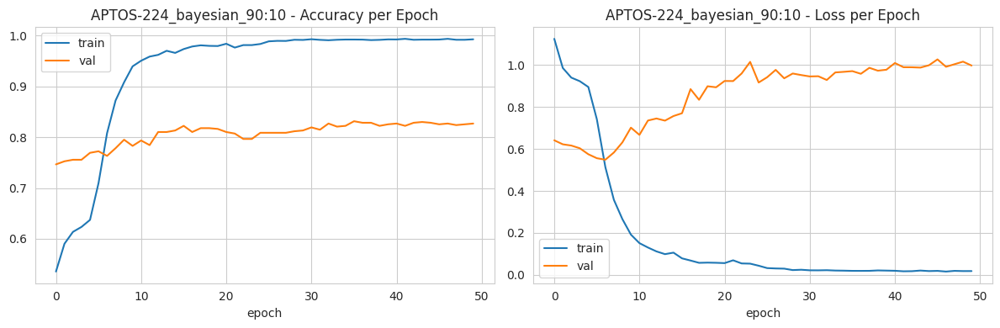

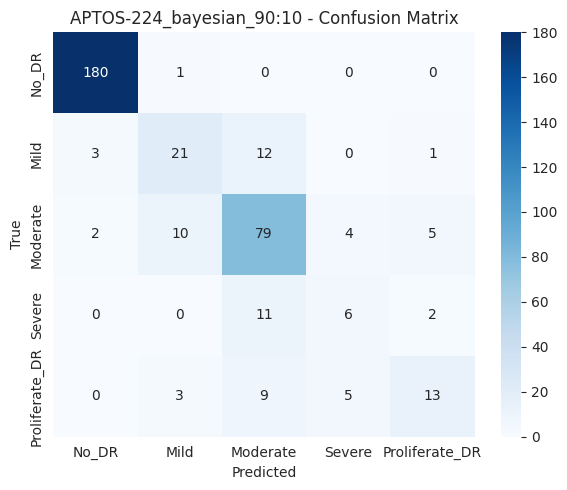


APTOS-224_bayesian_90:10: Acc=0.8147 | Precision(macro)=0.6607 | Sensitivity(macro)=0.6202 | Specificity(macro)=0.9522 | QWK=0.8732
Semua output tersimpan di: /content/drive/MyDrive/BayesianCNN/Experiments/APTOS-224_bayesian_90:10

EKSPERIMEN: Lokal_deterministic_90:10 (deterministic, split 90:10)
Train (oversampled): 555 | Val: 63 | Test: 36


Precompute cache:   0%|          | 0/246 [00:00<?, ?it/s]

Selesai: 1 gambar baru di-cache, 245 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/63 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 63 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/36 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 36 sudah ada (skip), 0 gagal.


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 01/5] train_loss=1.2658 val_loss=1.4299 | train_acc=0.4667 val_acc=0.4286 | train_qwk=0.4793 val_qwk=0.3157


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 02/5] train_loss=0.8455 val_loss=1.3630 | train_acc=0.6703 val_acc=0.4286 | train_qwk=0.6761 val_qwk=0.3719


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 03/5] train_loss=0.6432 val_loss=1.2799 | train_acc=0.7694 val_acc=0.4444 | train_qwk=0.7958 val_qwk=0.4228


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 04/5] train_loss=0.5204 val_loss=1.2246 | train_acc=0.8378 val_acc=0.4762 | train_qwk=0.8342 val_qwk=0.4537


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 05/5] train_loss=0.4264 val_loss=1.1886 | train_acc=0.8703 val_acc=0.4762 | train_qwk=0.8779 val_qwk=0.4227


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 01/45] train_loss=0.3809 val_loss=1.1624 | train_acc=0.8901 val_acc=0.5556 | train_qwk=0.8932 val_qwk=0.4885 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 02/45] train_loss=0.2406 val_loss=1.1841 | train_acc=0.9369 val_acc=0.5556 | train_qwk=0.9488 val_qwk=0.5796 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 03/45] train_loss=0.1543 val_loss=1.2562 | train_acc=0.9712 val_acc=0.5873 | train_qwk=0.9815 val_qwk=0.6343 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 04/45] train_loss=0.1130 val_loss=1.1829 | train_acc=0.9820 val_acc=0.6508 | train_qwk=0.9855 val_qwk=0.6510 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 05/45] train_loss=0.0669 val_loss=1.1857 | train_acc=0.9910 val_acc=0.5873 | train_qwk=0.9914 val_qwk=0.5781 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 06/45] train_loss=0.0519 val_loss=1.1740 | train_acc=0.9910 val_acc=0.6508 | train_qwk=0.9950 val_qwk=0.5874 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 07/45] train_loss=0.0349 val_loss=1.2118 | train_acc=0.9964 val_acc=0.6190 | train_qwk=0.9977 val_qwk=0.6257 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 08/45] train_loss=0.0218 val_loss=1.2244 | train_acc=1.0000 val_acc=0.6349 | train_qwk=1.0000 val_qwk=0.6221 | lr=5.00e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 09/45] train_loss=0.0189 val_loss=1.2332 | train_acc=1.0000 val_acc=0.6508 | train_qwk=1.0000 val_qwk=0.6379 | lr=5.00e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 10/45] train_loss=0.0176 val_loss=1.2906 | train_acc=1.0000 val_acc=0.6508 | train_qwk=1.0000 val_qwk=0.6583 | lr=5.00e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 11/45] train_loss=0.0151 val_loss=1.3367 | train_acc=0.9982 val_acc=0.6349 | train_qwk=0.9982 val_qwk=0.6532 | lr=5.00e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 12/45] train_loss=0.0118 val_loss=1.3953 | train_acc=1.0000 val_acc=0.6667 | train_qwk=1.0000 val_qwk=0.6854 | lr=5.00e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 13/45] train_loss=0.0123 val_loss=1.4273 | train_acc=0.9982 val_acc=0.6508 | train_qwk=0.9982 val_qwk=0.6818 | lr=5.00e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 14/45] train_loss=0.0098 val_loss=1.4545 | train_acc=1.0000 val_acc=0.6508 | train_qwk=1.0000 val_qwk=0.6818 | lr=5.00e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 15/45] train_loss=0.0126 val_loss=1.4826 | train_acc=0.9964 val_acc=0.6349 | train_qwk=0.9941 val_qwk=0.6695 | lr=5.00e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 16/45] train_loss=0.0096 val_loss=1.4497 | train_acc=1.0000 val_acc=0.6667 | train_qwk=1.0000 val_qwk=0.6769 | lr=2.50e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 17/45] train_loss=0.0084 val_loss=1.4489 | train_acc=1.0000 val_acc=0.6667 | train_qwk=1.0000 val_qwk=0.6769 | lr=2.50e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 18/45] train_loss=0.0112 val_loss=1.4626 | train_acc=0.9982 val_acc=0.6667 | train_qwk=0.9982 val_qwk=0.6769 | lr=2.50e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 19/45] train_loss=0.0069 val_loss=1.4842 | train_acc=1.0000 val_acc=0.6667 | train_qwk=1.0000 val_qwk=0.6769 | lr=2.50e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 20/45] train_loss=0.0075 val_loss=1.4812 | train_acc=1.0000 val_acc=0.6667 | train_qwk=1.0000 val_qwk=0.6769 | lr=1.25e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 21/45] train_loss=0.0066 val_loss=1.4791 | train_acc=1.0000 val_acc=0.6667 | train_qwk=1.0000 val_qwk=0.6769 | lr=1.25e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 22/45] train_loss=0.0086 val_loss=1.4823 | train_acc=1.0000 val_acc=0.6667 | train_qwk=1.0000 val_qwk=0.6769 | lr=1.25e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 23/45] train_loss=0.0093 val_loss=1.4502 | train_acc=0.9982 val_acc=0.6508 | train_qwk=0.9982 val_qwk=0.6583 | lr=1.25e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 24/45] train_loss=0.0087 val_loss=1.4680 | train_acc=1.0000 val_acc=0.6349 | train_qwk=1.0000 val_qwk=0.6548 | lr=6.25e-06
[EARLY STOPPING] epoch 24
Checkpoint terbaik: epoch 12 (fase 2, val_qwk=0.6854)
Model terbaik disalin ke: /content/drive/MyDrive/BayesianCNN/Experiments/Lokal_deterministic_90:10/best_model.pt


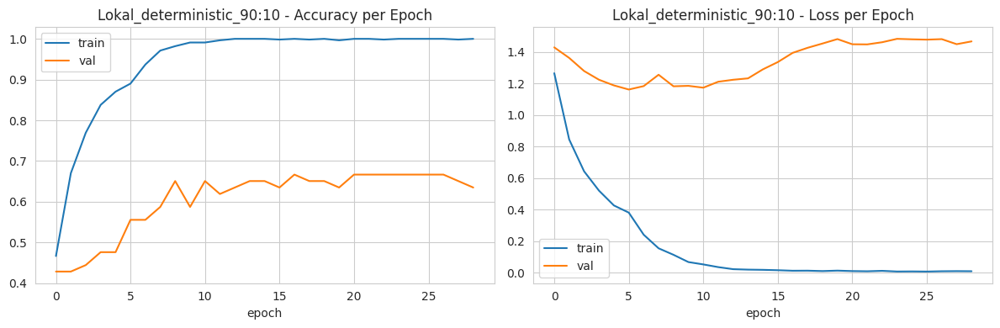

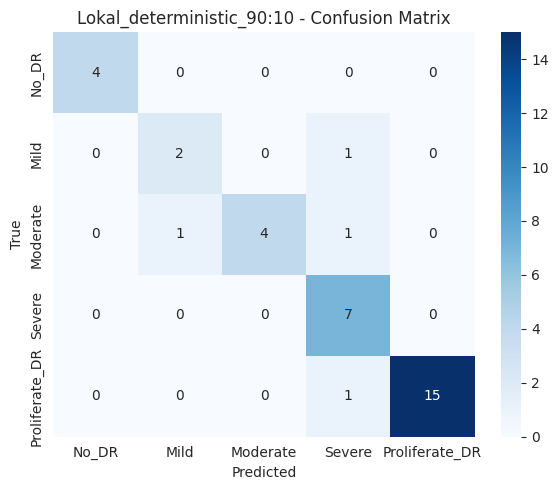


Lokal_deterministic_90:10: Acc=0.8889 | Precision(macro)=0.8733 | Sensitivity(macro)=0.8542 | Specificity(macro)=0.9732 | QWK=0.9477
Semua output tersimpan di: /content/drive/MyDrive/BayesianCNN/Experiments/Lokal_deterministic_90:10

EKSPERIMEN: Lokal_bayesian_90:10 (bayesian, split 90:10)
Train (oversampled): 555 | Val: 63 | Test: 36


Precompute cache:   0%|          | 0/246 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 246 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/63 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 63 sudah ada (skip), 0 gagal.


Precompute cache:   0%|          | 0/36 [00:00<?, ?it/s]

Selesai: 0 gambar baru di-cache, 36 sudah ada (skip), 0 gagal.


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 01/5] train_loss=1.4754 val_loss=1.4720 | train_acc=0.3694 val_acc=0.4286 | train_qwk=0.4208 val_qwk=0.3753


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 02/5] train_loss=1.2277 val_loss=1.3890 | train_acc=0.5063 val_acc=0.5079 | train_qwk=0.5628 val_qwk=0.5103


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 03/5] train_loss=1.0904 val_loss=1.3758 | train_acc=0.5874 val_acc=0.4127 | train_qwk=0.6345 val_qwk=0.3084


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 04/5] train_loss=0.9683 val_loss=1.3372 | train_acc=0.6216 val_acc=0.4286 | train_qwk=0.6322 val_qwk=0.3981


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P1 05/5] train_loss=0.9178 val_loss=1.3052 | train_acc=0.6378 val_acc=0.4444 | train_qwk=0.7048 val_qwk=0.4141


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 01/45] train_loss=0.8483 val_loss=1.1874 | train_acc=0.6685 val_acc=0.5556 | train_qwk=0.6814 val_qwk=0.5530 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 02/45] train_loss=0.6316 val_loss=1.1039 | train_acc=0.7712 val_acc=0.5238 | train_qwk=0.7858 val_qwk=0.5268 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 03/45] train_loss=0.5144 val_loss=1.0479 | train_acc=0.8414 val_acc=0.5556 | train_qwk=0.8489 val_qwk=0.5962 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 04/45] train_loss=0.4140 val_loss=1.0496 | train_acc=0.8757 val_acc=0.5873 | train_qwk=0.8707 val_qwk=0.6522 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 05/45] train_loss=0.2906 val_loss=1.0442 | train_acc=0.9261 val_acc=0.5714 | train_qwk=0.9463 val_qwk=0.5941 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 06/45] train_loss=0.2306 val_loss=1.0932 | train_acc=0.9387 val_acc=0.5873 | train_qwk=0.9432 val_qwk=0.5282 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 07/45] train_loss=0.1585 val_loss=1.2007 | train_acc=0.9748 val_acc=0.6032 | train_qwk=0.9766 val_qwk=0.5757 | lr=1.00e-04


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 08/45] train_loss=0.1154 val_loss=1.3151 | train_acc=0.9784 val_acc=0.5873 | train_qwk=0.9870 val_qwk=0.6421 | lr=5.00e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 09/45] train_loss=0.0950 val_loss=1.3229 | train_acc=0.9892 val_acc=0.6032 | train_qwk=0.9874 val_qwk=0.6614 | lr=5.00e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 10/45] train_loss=0.0832 val_loss=1.2935 | train_acc=0.9874 val_acc=0.5714 | train_qwk=0.9941 val_qwk=0.5909 | lr=5.00e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 11/45] train_loss=0.0625 val_loss=1.3202 | train_acc=0.9910 val_acc=0.5873 | train_qwk=0.9860 val_qwk=0.5422 | lr=5.00e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 12/45] train_loss=0.0525 val_loss=1.3478 | train_acc=1.0000 val_acc=0.6032 | train_qwk=1.0000 val_qwk=0.5791 | lr=5.00e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 13/45] train_loss=0.0523 val_loss=1.4101 | train_acc=0.9964 val_acc=0.6190 | train_qwk=0.9978 val_qwk=0.5986 | lr=2.50e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 14/45] train_loss=0.0478 val_loss=1.4081 | train_acc=0.9946 val_acc=0.6032 | train_qwk=0.9973 val_qwk=0.5791 | lr=2.50e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 15/45] train_loss=0.0374 val_loss=1.4117 | train_acc=0.9982 val_acc=0.6032 | train_qwk=0.9995 val_qwk=0.6489 | lr=2.50e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 16/45] train_loss=0.0355 val_loss=1.4069 | train_acc=0.9982 val_acc=0.6032 | train_qwk=0.9960 val_qwk=0.6489 | lr=2.50e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 17/45] train_loss=0.0453 val_loss=1.4146 | train_acc=0.9928 val_acc=0.6190 | train_qwk=0.9882 val_qwk=0.6680 | lr=2.50e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 18/45] train_loss=0.0389 val_loss=1.4380 | train_acc=0.9964 val_acc=0.6190 | train_qwk=0.9977 val_qwk=0.6680 | lr=2.50e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 19/45] train_loss=0.0270 val_loss=1.4523 | train_acc=0.9982 val_acc=0.6190 | train_qwk=0.9982 val_qwk=0.6680 | lr=2.50e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 20/45] train_loss=0.0271 val_loss=1.4595 | train_acc=1.0000 val_acc=0.6190 | train_qwk=1.0000 val_qwk=0.6680 | lr=2.50e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 21/45] train_loss=0.0314 val_loss=1.4727 | train_acc=1.0000 val_acc=0.6190 | train_qwk=1.0000 val_qwk=0.6680 | lr=1.25e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 22/45] train_loss=0.0397 val_loss=1.4663 | train_acc=0.9928 val_acc=0.6190 | train_qwk=0.9896 val_qwk=0.6680 | lr=1.25e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 23/45] train_loss=0.0267 val_loss=1.4781 | train_acc=0.9982 val_acc=0.6190 | train_qwk=0.9982 val_qwk=0.6680 | lr=1.25e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 24/45] train_loss=0.0301 val_loss=1.4704 | train_acc=0.9964 val_acc=0.6190 | train_qwk=0.9964 val_qwk=0.6680 | lr=1.25e-05


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 25/45] train_loss=0.0223 val_loss=1.4738 | train_acc=1.0000 val_acc=0.6190 | train_qwk=1.0000 val_qwk=0.6680 | lr=6.25e-06


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 26/45] train_loss=0.0270 val_loss=1.4873 | train_acc=0.9982 val_acc=0.6190 | train_qwk=0.9982 val_qwk=0.6680 | lr=6.25e-06


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 27/45] train_loss=0.0254 val_loss=1.5018 | train_acc=1.0000 val_acc=0.6190 | train_qwk=1.0000 val_qwk=0.6680 | lr=6.25e-06


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 28/45] train_loss=0.0247 val_loss=1.5071 | train_acc=1.0000 val_acc=0.6190 | train_qwk=1.0000 val_qwk=0.6680 | lr=6.25e-06


Train:   0%|          | 0/9 [00:00<?, ?it/s]

Val:   0%|          | 0/1 [00:00<?, ?it/s]

[P2 29/45] train_loss=0.0291 val_loss=1.5062 | train_acc=1.0000 val_acc=0.6190 | train_qwk=1.0000 val_qwk=0.6680 | lr=3.13e-06
[EARLY STOPPING] epoch 29
Checkpoint terbaik: epoch 17 (fase 2, val_qwk=0.6680)
Model terbaik disalin ke: /content/drive/MyDrive/BayesianCNN/Experiments/Lokal_bayesian_90:10/best_model.pt


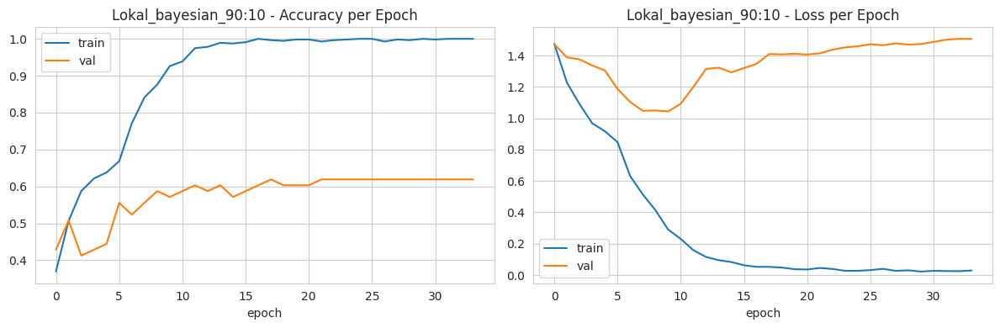

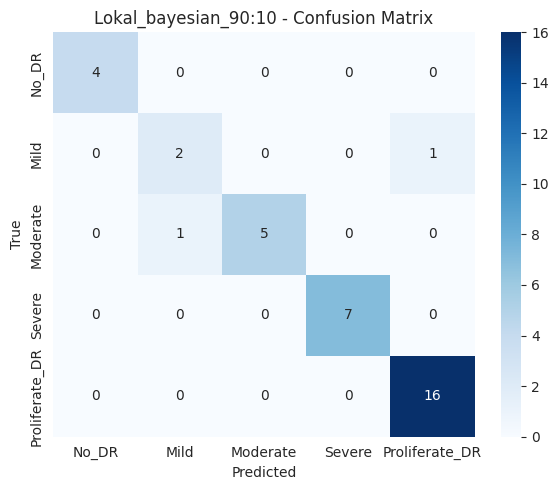


Lokal_bayesian_90:10: Acc=0.9444 | Precision(macro)=0.9216 | Sensitivity(macro)=0.9000 | Specificity(macro)=0.9839 | QWK=0.9272
Semua output tersimpan di: /content/drive/MyDrive/BayesianCNN/Experiments/Lokal_bayesian_90:10


In [23]:
for scenario in ["70:30", "80:20", "90:10"]:
    for dataset_name, df in [("APTOS-224", aptos_224_df), ("Lokal", local_df)]:
        for model_type in ["deterministic", "bayesian"]:
            results.append(
                run_experiment(
                    df, model_type, scenario, f"{dataset_name}_{model_type}_{scenario}"
                )
            )

In [24]:
results_df = pd.DataFrame(
    [
        {
            k: v
            for k, v in r.items()
            if k not in ("model", "history", "confusion_matrix", "test_loader")
        }
        for r in results
    ]
)
results_df.to_csv(os.path.join(DRIVE_EXP_ROOT, "results_summary.csv"), index=False)
results_df.to_excel(os.path.join(DRIVE_EXP_ROOT, "results_summary.xlsx"), index=False)
results_df

,experiment,model_type,split_scenario,accuracy,precision_macro,sensitivity_macro,specificity_macro,qwk,best_epoch,best_phase
0,APTOS-224_deterministic_70:30,deterministic,70:30,0.785259,0.626900,0.621024,0.946479,0.857673,7,2
1,APTOS-224_bayesian_70:30,bayesian,70:30,0.777070,0.626790,0.646726,0.945567,0.870102,4,2
2,Lokal_deterministic_70:30,deterministic,70:30,0.641509,0.640210,0.642104,0.903531,0.626882,1,2
3,Lokal_bayesian_70:30,bayesian,70:30,0.594340,0.544801,0.549882,0.890431,0.720660,2,2
4,APTOS-224_deterministic_80:20,deterministic,80:20,0.776262,0.600126,0.611560,0.944644,0.851577,1,2
5,APTOS-224_bayesian_80:20,bayesian,80:20,0.804911,0.641058,0.632063,0.950470,0.860355,12,2
6,Lokal_deterministic_80:20,deterministic,80:20,0.873239,0.905509,0.844240,0.961299,0.927202,6,2
7,Lokal_bayesian_80:20,bayesian,80:20,0.830986,0.822484,0.771121,0.949713,0.874857,19,2
8,APTOS-224_deterministic_90:10,deterministic,90:10,0.787466,0.609551,0.602023,0.946010,0.862361,12,2
9,APTOS-224_bayesian_90:10,bayesian,90:10,0.814714,0.660746,0.620233,0.952249,0.873194,38,2
